# Cell 1: Imports and Environment Setup

In [1]:
import os
import random
import numpy as np
import pandas as pd
from pathlib import Path
from collections import Counter
import time
import json

import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight

import tensorflow as tf
from tensorflow.keras import layers, models, applications, optimizers, callbacks, utils
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array


import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision.models as models_torch
from torchvision.models import GoogLeNet_Weights

def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)

set_seed(42)

os.makedirs('/kaggle/working/models', exist_ok=True)
os.makedirs('/kaggle/working/plots', exist_ok=True)
os.makedirs('/kaggle/working/reports', exist_ok=True)

print("TensorFlow version:", tf.__version__)
print("PyTorch version:", torch.__version__)
print("GPU Available:", tf.config.list_physical_devices('GPU'))
print("CUDA Available:", torch.cuda.is_available())

if tf.config.list_physical_devices('GPU'):
    print("GPU Device:", tf.config.list_physical_devices('GPU')[0])
    policy = tf.keras.mixed_precision.Policy('mixed_float16')
    tf.keras.mixed_precision.set_global_policy(policy)
    print("Mixed precision enabled")

2025-12-08 17:01:20.555980: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1765213280.755859      47 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1765213280.809655      47 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

TensorFlow version: 2.18.0
PyTorch version: 2.6.0+cu124
GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]
CUDA Available: True
GPU Device: PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')
Mixed precision enabled


# Cell 2: Dataset Exploration and Statistics


In [2]:
dataset_path = "/kaggle/input/celebrity-face-dataset-augmented/FaceDatasetNoDuplicates"

def explore_dataset(path):
    classes = [d for d in os.listdir(path) if os.path.isdir(os.path.join(path, d))]
    print(f"Total classes found: {len(classes)}")
    
    class_counts = {}
    image_paths = {}
    image_sizes = []
    
    for class_name in classes:
        class_path = os.path.join(path, class_name)
        images = [f for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        class_counts[class_name] = len(images)
        image_paths[class_name] = [os.path.join(class_path, img) for img in images]
        
        for img_path in image_paths[class_name][:5]:
            try:
                with Image.open(img_path) as img:
                    image_sizes.append(img.size)
            except:
                continue
    
    return classes, class_counts, image_paths, image_sizes

classes, class_counts, image_paths, image_sizes = explore_dataset(dataset_path)

print(f"\nDataset Statistics:")
print(f"Total classes: {len(classes)}")
print(f"Total images: {sum(class_counts.values())}")
print(f"Max images per class: {max(class_counts.values())}")
print(f"Min images per class: {min(class_counts.values())}")
print(f"Average images per class: {sum(class_counts.values()) / len(class_counts):.2f}")

if image_sizes:
    size_counts = Counter(image_sizes)
    most_common_size = size_counts.most_common(1)[0]
    print(f"Most common image size: {most_common_size[0]} (appears {most_common_size[1]} times)")

selected_classes = sorted(class_counts.items(), key=lambda x: x[1], reverse=True)[:14]
selected_class_names = [cls[0] for cls in selected_classes]
selected_class_counts = [cls[1] for cls in selected_classes]

print(f"\nSelected top {len(selected_class_names)} classes:")
for i, (cls, count) in enumerate(selected_classes[:10]):  
    print(f"  {i+1:2d}. {cls}: {count} images")
print(f"  ... and {len(selected_classes)-10} more")

max_count = max(selected_class_counts)
min_count = min(selected_class_counts)
imbalance_ratio = max_count / min_count if min_count > 0 else float('inf')
print(f"\nImbalance ratio: {imbalance_ratio:.2f}")


Total classes found: 14

Dataset Statistics:
Total classes: 14
Total images: 3980
Max images per class: 431
Min images per class: 259
Average images per class: 284.29
Most common image size: (211, 266) (appears 2 times)

Selected top 14 classes:
   1. Scarlett Johansson: 431 images
   2. Megan Fox: 286 images
   3. Natalie Portman: 284 images
   4. Jennifer Lawrence: 279 images
   5. Denzel Washington: 279 images
   6. Hugh Jackman: 278 images
   7. Tom Hanks: 275 images
   8. Kate Winslet: 275 images
   9. Leonardo DiCaprio: 275 images
  10. Angelina Jolie: 273 images
  ... and 4 more

Imbalance ratio: 1.66


# Cell 3: Data Visualization - Class Distribution

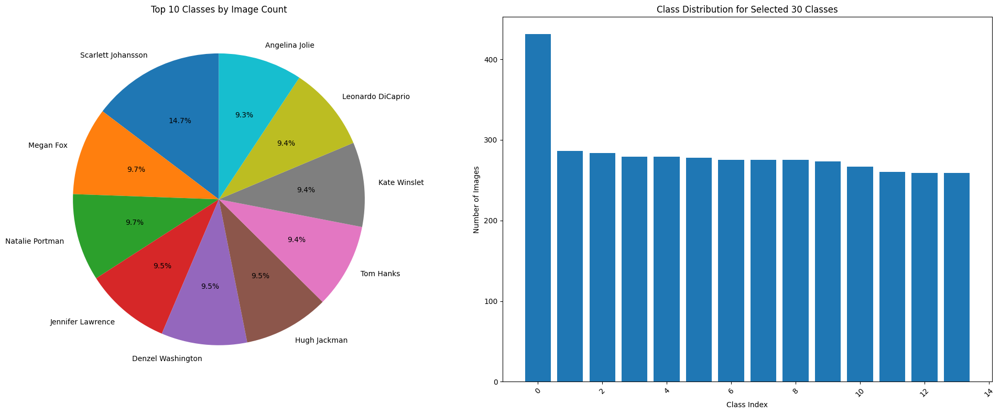


Sample images from dataset:


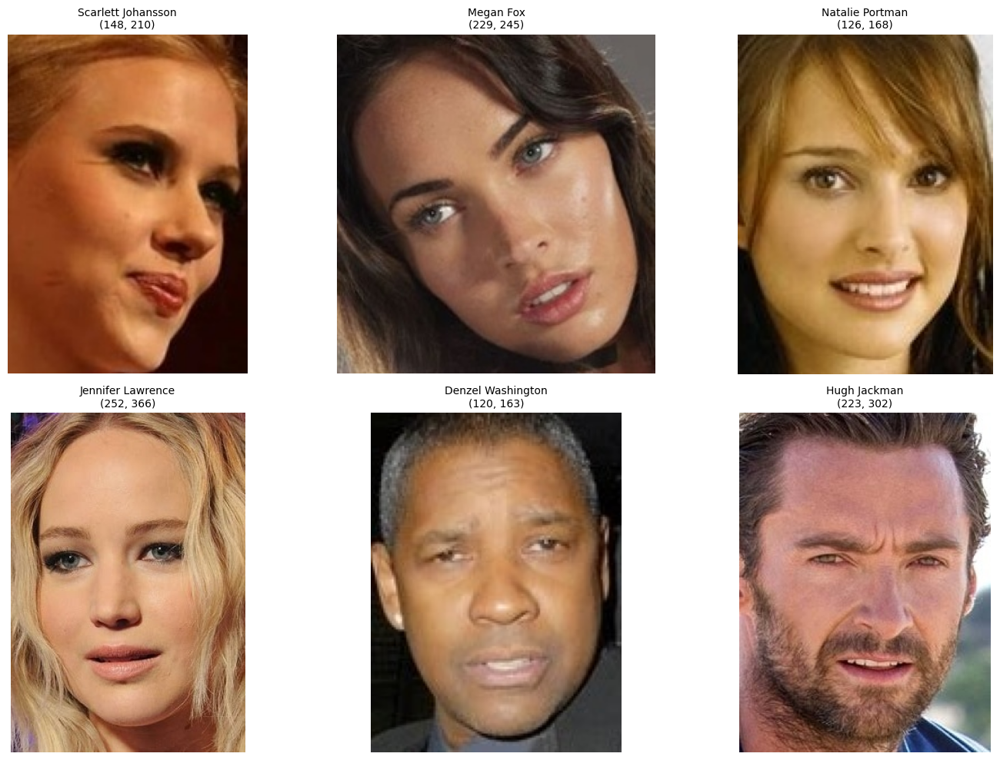

In [3]:
plt.figure(figsize=(20, 8))

plt.subplot(1, 2, 1)
top_10_classes = selected_classes[:10]
plt.pie([count for _, count in top_10_classes], 
        labels=[name for name, _ in top_10_classes], 
        autopct='%1.1f%%', startangle=90)
plt.title('Top 10 Classes by Image Count')

plt.subplot(1, 2, 2)
plt.bar(range(len(selected_class_counts)), selected_class_counts)
plt.xlabel('Class Index')
plt.ylabel('Number of Images')
plt.title('Class Distribution for Selected 30 Classes')
plt.xticks(rotation=45)

plt.tight_layout()
plt.savefig('/kaggle/working/plots/class_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

print("\nSample images from dataset:")
plt.figure(figsize=(15, 10))
for i, class_name in enumerate(selected_class_names[:6]):
    class_img_paths = image_paths[class_name]
    if class_img_paths:
        sample_img_path = class_img_paths[0]
        try:
            img = Image.open(sample_img_path)
            plt.subplot(2, 3, i+1)
            plt.imshow(img)
            plt.title(f'{class_name}\n{img.size}', fontsize=10)
            plt.axis('off')
        except Exception as e:
            print(f"Error loading image {sample_img_path}: {e}")

plt.tight_layout()
plt.savefig('/kaggle/working/plots/sample_images.png', dpi=300, bbox_inches='tight')
plt.show()

# Cell 4: Data Loading and Preprocessing Functions

In [4]:

IMG_SIZE = (224, 224)  
BATCH_SIZE = 32
NUM_CLASSES = len(selected_class_names)

class FaceDataset:
    def __init__(self, image_paths, labels, class_names):
        self.image_paths = image_paths
        self.labels = labels
        self.class_names = class_names
        self.le = LabelEncoder()
        self.encoded_labels = self.le.fit_transform(labels)
        
    def __len__(self):
        return len(self.image_paths)
    
    def load_images(self, target_size=IMG_SIZE):
        images = []
        valid_paths = []
        valid_labels = []
        
        for i, img_path in enumerate(self.image_paths):
            try:
                img = load_img(img_path, target_size=target_size)
                img_array = img_to_array(img)
                images.append(img_array)
                valid_paths.append(img_path)
                valid_labels.append(self.encoded_labels[i])
            except Exception as e:
                print(f"Error loading {img_path}: {e}")
                continue
                
        return np.array(images), np.array(valid_labels), valid_paths

all_image_paths = []
all_labels = []

for class_name in selected_class_names:
    paths = image_paths[class_name]
    class_idx = selected_class_names.index(class_name)

    all_image_paths.extend(paths)
    all_labels.extend([class_idx] * len(paths))



print(f"Total images for selected classes: {len(all_image_paths)}")
print(f"Total labels: {len(all_labels)}")

dataset = FaceDataset(all_image_paths, all_labels, selected_class_names)
X, y, valid_paths = dataset.load_images()

print(f"Successfully loaded {len(X)} images")
print(f"Image shape: {X.shape}")
print(f"Labels shape: {y.shape}")

y_categorical = utils.to_categorical(y, num_classes=NUM_CLASSES)

X_train, X_temp, y_train, y_temp, y_train_cat, y_temp_cat = train_test_split(
    X, y, y_categorical, test_size=0.3, random_state=42, stratify=y
)

X_val, X_test, y_val, y_test, y_val_cat, y_test_cat = train_test_split(
    X_temp, y_temp, y_temp_cat, test_size=0.5, random_state=42, stratify=y_temp
)

print(f"\nData split:")
print(f"Training: {X_train.shape[0]} images")
print(f"Validation: {X_val.shape[0]} images")
print(f"Test: {X_test.shape[0]} images")

Total images for selected classes: 3980
Total labels: 3980
Successfully loaded 3980 images
Image shape: (3980, 224, 224, 3)
Labels shape: (3980,)

Data split:
Training: 2786 images
Validation: 597 images
Test: 597 images


# Cell 5: Augmentation Strategy and Visualization

In [5]:
def create_augmentation_generator():
    return ImageDataGenerator(
        rotation_range=25,  
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.25,
        horizontal_flip=True,
        vertical_flip=False,
        fill_mode='reflect',  
        brightness_range=[0.8, 1.3],
        channel_shift_range=0.2,
        validation_split=0.0
    )

def create_validation_generator():
    return ImageDataGenerator()

class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train),
    y=y_train
)
class_weight_dict = {i: weight for i, weight in enumerate(class_weights)}

print("Enhanced Class weights for imbalanced learning:")
for i, class_name in enumerate(selected_class_names):
    if i in class_weight_dict:
        print(f"  {class_name}: {class_weight_dict[i]:.2f}")

def categorical_crossentropy_with_smoothing(y_true, y_pred):
    return tf.keras.losses.categorical_crossentropy(
        y_true, y_pred, label_smoothing=0.15 
    )

def focal_loss(gamma=2.0, alpha=0.25):
    def focal_loss_fixed(y_true, y_pred):
        pt = tf.where(tf.equal(y_true, 1), y_pred, 1 - y_pred)
        alpha_t = tf.where(tf.equal(y_true, 1), alpha, 1 - alpha)
        return -alpha_t * tf.pow(1.0 - pt, gamma) * tf.math.log(pt + tf.keras.backend.epsilon())
    return focal_loss_fixed

sample_weights = np.ones(len(y_train))
for i, label in enumerate(y_train):
    sample_weights[i] = class_weight_dict[label]

print(f"Sample weights range: {sample_weights.min():.2f} - {sample_weights.max():.2f}")

Enhanced Class weights for imbalanced learning:
  Scarlett Johansson: 0.66
  Megan Fox: 0.99
  Natalie Portman: 1.00
  Jennifer Lawrence: 1.02
  Denzel Washington: 1.02
  Hugh Jackman: 1.02
  Tom Hanks: 1.03
  Kate Winslet: 1.03
  Leonardo DiCaprio: 1.04
  Angelina Jolie: 1.04
  Will Smith: 1.06
  Brad Pitt: 1.09
  Sandra Bullock: 1.10
  Tom Cruise: 1.10
Sample weights range: 0.66 - 1.10


# Cell 6: Direct Augmentation Visualization Function

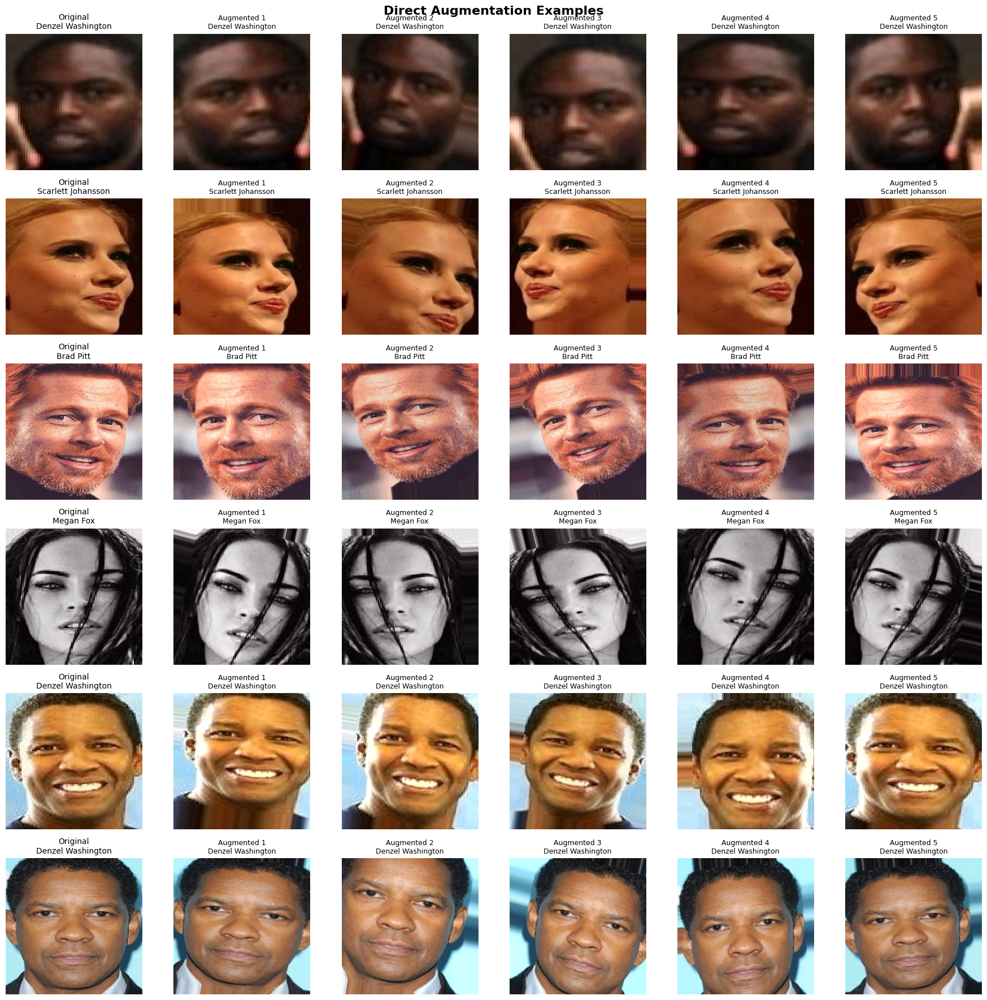

✓ Direct augmentation visualization saved as 'direct_augmentation_samples.png'


In [6]:
def visualize_direct_augmentations(X_original, y_original, class_names, n_samples=5):
    from tensorflow.keras.preprocessing.image import ImageDataGenerator

    if len(y_original.shape) > 1:
        y_integer = np.argmax(y_original, axis=1)
    else:
        y_integer = y_original

    datagen = ImageDataGenerator(
        rotation_range=15,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.1,
        zoom_range=0.1,
        horizontal_flip=True,
        fill_mode='nearest',
        brightness_range=[0.9, 1.1]
    )

    fig, axes = plt.subplots(n_samples, 6, figsize=(18, 3 * n_samples))

    for i in range(n_samples):

        idx = np.random.randint(0, len(X_original))
        orig_image = X_original[idx]
        true_class_idx = y_integer[idx]
        true_class_name = class_names[true_class_idx]

        axes[i, 0].imshow(orig_image.astype('uint8'))
        axes[i, 0].set_title(f"Original\n{true_class_name}", fontsize=10)
        axes[i, 0].axis("off")

        image_batch = orig_image.reshape((1,) + orig_image.shape)
        aug_generator = datagen.flow(image_batch, batch_size=1)

        for j in range(5):
            aug_image = next(aug_generator)[0].astype("uint8")
            axes[i, j + 1].imshow(aug_image)
            axes[i, j + 1].set_title(f"Augmented {j+1}\n{true_class_name}", fontsize=9)
            axes[i, j + 1].axis("off")

    plt.suptitle("Direct Augmentation Examples", fontsize=16, fontweight="bold")
    plt.tight_layout()
    plt.savefig("/kaggle/working/plots/direct_augmentation_samples.png", dpi=300, bbox_inches="tight")
    plt.show()


    print("✓ Direct augmentation visualization saved as 'direct_augmentation_samples.png'")

visualize_direct_augmentations(X_train, y_train, selected_class_names, n_samples=6)

# Cell 7: Utility Functions for Metrics and Visualization

In [7]:
def calculate_top_k_accuracy(y_true, y_pred_proba, k=3):
    top_k_preds = np.argsort(y_pred_proba, axis=1)[:, -k:]
    y_true_expanded = np.expand_dims(y_true, axis=1)
    matches = np.any(top_k_preds == y_true_expanded, axis=1)
    return np.mean(matches)

def plot_learning_curves(history, model_name):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    if hasattr(history, 'history'):
        history_dict = history.history
    else:
        history_dict = history
    
    
    ax1.plot(history_dict['loss'], label='Training Loss')
    if 'val_loss' in history_dict:
        ax1.plot(history_dict['val_loss'], label='Validation Loss')
    ax1.set_title(f'{model_name} - Loss')
    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.legend()
    ax1.grid(True)
    
   
    ax2.plot(history_dict['accuracy'], label='Training Accuracy')
    if 'val_accuracy' in history_dict:
        ax2.plot(history_dict['val_accuracy'], label='Validation Accuracy')
    ax2.set_title(f'{model_name} - Accuracy')
    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.legend()
    ax2.grid(True)
    
    plt.tight_layout()
    plt.savefig(f'/kaggle/working/plots/learning_curves_{model_name}.png', dpi=300, bbox_inches='tight')
    plt.show()

def plot_confusion_matrix(y_true, y_pred, class_names, model_name):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f'Confusion Matrix - {model_name}')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.savefig(f'/kaggle/working/plots/confusion_matrix_{model_name}.png', dpi=300, bbox_inches='tight')
    plt.show()

def plot_roc_curves(y_true, y_pred_proba, class_names, model_name):
    n_classes = len(class_names)
    fpr = {}
    tpr = {}
    roc_auc = {}
    
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_pred_proba[:, i])
        roc_auc[i] = roc_auc_score(y_true[:, i], y_pred_proba[:, i])
    
    fpr["micro"], tpr["micro"], _ = roc_curve(y_true.ravel(), y_pred_proba.ravel())
    roc_auc["micro"] = roc_auc_score(y_true, y_pred_proba, multi_class="ovr", average="micro")
    
    plt.figure(figsize=(10, 8))
    colors = plt.cm.rainbow(np.linspace(0, 1, n_classes))
    
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label='{0} (AUC = {1:0.2f})'.format(class_names[i], roc_auc[i]))
    
    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curves - {model_name}')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f'/kaggle/working/plots/roc_auc_{model_name}.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    return roc_auc

class EnhancedTrainingMonitor(callbacks.Callback):
    
    def __init__(self):
        super().__init__()
        self.best_val_acc = 0
        self.patience_counter = 0
        self.stalled_epochs = 0
        
    def on_epoch_end(self, epoch, logs=None):
        train_acc = logs.get('accuracy', 0)
        val_acc = logs.get('val_accuracy', 0)
        train_loss = logs.get('loss', 0)
        val_loss = logs.get('val_loss', 0)
        
        acc_gap = train_acc - val_acc
        loss_ratio = val_loss / (train_loss + 1e-8)
        
        if acc_gap > 0.25 and loss_ratio > 1.8:
            status = "🚨 SEVERE OVERFITTING"
            recommendation = "Increase regularization, add more dropout"
        elif acc_gap > 0.15 and loss_ratio > 1.5:
            status = "⚠️ MODERATE OVERFITTING"
            recommendation = "Consider early stopping or reduce LR"
        elif train_acc < 0.4 and val_acc < 0.4 and epoch > 5:
            status = "🚨 SEVERE UNDERFITTING"
            recommendation = "Increase model capacity, reduce regularization"
        elif train_acc < 0.6 and val_acc < 0.6 and epoch > 10:
            status = "⚠️ MODERATE UNDERFITTING"
            recommendation = "Train longer, increase LR, reduce dropout"
        elif acc_gap < 0.03 and abs(loss_ratio - 1) < 0.1:
            status = "✅ EXCELLENT GENERALIZATION"
            recommendation = "Optimal training"
        elif acc_gap < 0.08 and abs(loss_ratio - 1) < 0.2:
            status = "👍 GOOD PROGRESS"
            recommendation = "Continue training"
        else:
            status = "🔄 TRAINING NORMALLY"
            recommendation = "Monitor progress"
        
        if abs(val_acc - self.best_val_acc) < 0.001:
            self.stalled_epochs += 1
        else:
            self.stalled_epochs = 0
            
        if val_acc > self.best_val_acc:
            self.best_val_acc = val_acc
            self.patience_counter = 0
        else:
            self.patience_counter += 1
            
        if self.stalled_epochs > 5:
            status += " | ⏳ STAGNATING"
            recommendation += " | Consider changing strategy"
            
        print(f"Epoch {epoch+1:2d}: Train Acc {train_acc:.4f}, Val Acc {val_acc:.4f} | "
              f"Gap: {acc_gap:.3f} | Loss Ratio: {loss_ratio:.2f} | {status}")
        if epoch < 10 or "UNDERFITTING" in status or "OVERFITTING" in status:
            print(f"   Recommendation: {recommendation}")

# Cell 8: Model 1 - ResNet Implementation

In [8]:
def build_resnet_model(input_shape=(224, 224, 3), num_classes=14):
    base_model = applications.ResNet50(
        weights='imagenet',
        include_top=False,
        input_shape=input_shape
    )
    
    base_model.trainable = False
    
    inputs = tf.keras.Input(shape=input_shape)
    
    x = base_model(inputs, training=False)
    
    x = layers.GlobalAveragePooling2D()(x)
    
    x = layers.Dense(512, activation='relu', 
                    kernel_regularizer=tf.keras.regularizers.l1_l2(l1=1e-5, l2=1e-4))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.6)(x)
    
    x = layers.Dense(256, activation='relu', 
                    kernel_regularizer=tf.keras.regularizers.l1_l2(l1=1e-5, l2=1e-4))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    
    x = layers.Dense(128, activation='relu', 
                    kernel_regularizer=tf.keras.regularizers.l2(1e-4))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.4)(x)
    
    outputs = layers.Dense(num_classes, activation='softmax', dtype='float32')(x)
    
    model = tf.keras.Model(inputs, outputs)
    return model

def unfreeze_resnet_layers(model, unfreeze_layers=20, learning_rate=1e-5):
    base_model = model.layers[1]  
    
    base_model.trainable = True
    
    for layer in base_model.layers[:-unfreeze_layers]:
        layer.trainable = False
    
    model.compile(
        optimizer=optimizers.Adam(
            learning_rate=learning_rate,
            beta_1=0.9,
            beta_2=0.999,
            epsilon=1e-08
        ),
        loss=categorical_crossentropy_with_smoothing,
        metrics=['accuracy']
    )
    
    print(f"Unfrozen {unfreeze_layers} layers for fine-tuning")
    print(f"Trainable layers: {sum([layer.trainable for layer in base_model.layers])}/{len(base_model.layers)}")
    
    return model

resnet_model = build_resnet_model(num_classes=NUM_CLASSES)
resnet_model.compile(
    optimizer=optimizers.Adam(
        learning_rate=1e-3, 
        beta_1=0.9,
        beta_2=0.999
    ),
    loss=categorical_crossentropy_with_smoothing,
    metrics=['accuracy']
)

print("Enhanced ResNet Model Summary:")
resnet_model.summary()

total_params = resnet_model.count_params()
trainable_params = sum([tf.keras.backend.count_params(w) for w in resnet_model.trainable_weights])
print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print(f"Non-trainable parameters: {total_params - trainable_params:,}")

I0000 00:00:1765213332.192865      47 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1765213332.193569      47 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Enhanced ResNet Model Summary:


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ cast_1 (Cast)                   │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 14)             │         1,806 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,806,414 (94.63 MB)

 Trainable params: 1,216,910 (4.64 MB)

 Non-trainable params: 23,589,504 (89.99 MB)

Total parameters: 24,806,414
Trainable parameters: 1,216,910
Non-trainable parameters: 23,589,504


# Cell 9: ResNet Training

Training ResNet with ENHANCED strategy and augmentation...
PHASE 1: Warm-up training (Head only)


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/26


I0000 00:00:1765213345.416113     116 service.cc:148] XLA service 0x7c4fcc06b7c0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1765213345.417350     116 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1765213345.417371     116 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1765213347.282729     116 cuda_dnn.cc:529] Loaded cuDNN version 90300


 1/88 ━━━━━━━━━━━━━━━━━━━━ 28:37 20s/step - accuracy: 0.0312 - loss: 4.2929

I0000 00:00:1765213355.675190     116 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 442ms/step - accuracy: 0.1220 - loss: 3.8097Epoch  1: Train Acc 0.1712, Val Acc 0.2864 | Gap: -0.115 | Loss Ratio: 0.79 | 🔄 TRAINING NORMALLY
   Recommendation: Monitor progress
88/88 ━━━━━━━━━━━━━━━━━━━━ 69s 572ms/step - accuracy: 0.1226 - loss: 3.8058 - val_accuracy: 0.2864 - val_loss: 2.7412 - learning_rate: 0.0010
Epoch 2/26
88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step - accuracy: 0.2622 - loss: 2.9785Epoch  2: Train Acc 0.2760, Val Acc 0.4858 | Gap: -0.210 | Loss Ratio: 0.78 | 🔄 TRAINING NORMALLY
   Recommendation: Monitor progress
88/88 ━━━━━━━━━━━━━━━━━━━━ 33s 379ms/step - accuracy: 0.2624 - loss: 2.9776 - val_accuracy: 0.4858 - val_loss: 2.2661 - learning_rate: 0.0010
Epoch 3/26
88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step - accuracy: 0.3241 - loss: 2.6931Epoch  3: Train Acc 0.3439, Val Acc 0.4489 | Gap: -0.105 | Loss Ratio: 0.89 | 👍 GOOD PROGRESS
   Recommendation: Continue training
88/88 ━━━━━━━━━━━━━━━━━━━━ 32s 366ms/step - accuracy: 0.3243 - loss: 2.69

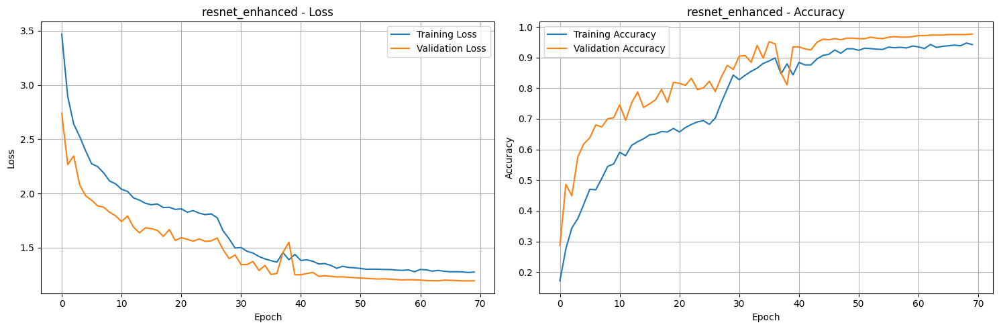

In [9]:
def train_resnet_with_enhanced_strategy(model, model_name, X_train, y_train, X_val, y_val, 
                                      use_augmentation=True, epochs=80):
  
    print("=" * 60)
    print("PHASE 1: Warm-up training (Head only)")
    print("=" * 60)
    
    callbacks_phase1 = [
        callbacks.EarlyStopping(monitor='val_accuracy', patience=12, restore_best_weights=True, mode='max'),
        callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.7, patience=5, min_lr=1e-7, verbose=1),
        callbacks.ModelCheckpoint(
            f'/kaggle/working/models/{model_name}_phase1_best.keras',
            monitor='val_accuracy',
            save_best_only=True,
            save_weights_only=False,
            mode='max'
        ),
        EnhancedTrainingMonitor()
    ]
    
    model.compile(
        optimizer=optimizers.Adam(learning_rate=1e-3),
        loss=categorical_crossentropy_with_smoothing,
        metrics=['accuracy']
    )
    
    if use_augmentation:
        train_datagen = create_augmentation_generator()
        train_generator = train_datagen.flow(X_train, y_train, batch_size=BATCH_SIZE)
        val_datagen = create_validation_generator()
        val_generator = val_datagen.flow(X_val, y_val, batch_size=BATCH_SIZE)
        
        history_phase1 = model.fit(
            train_generator,
            epochs=epochs//3,
            validation_data=val_generator,
            callbacks=callbacks_phase1,
            class_weight=class_weight_dict,
            verbose=1
        )
    else:
        history_phase1 = model.fit(
            X_train, y_train,
            batch_size=BATCH_SIZE,
            epochs=epochs//3,
            validation_data=(X_val, y_val),
            callbacks=callbacks_phase1,
            class_weight=class_weight_dict,
            verbose=1
        )
    
    print("\n" + "=" * 60)
    print("PHASE 2: Intermediate fine-tuning (20 layers)")
    print("=" * 60)
    
    model = unfreeze_resnet_layers(model, unfreeze_layers=20, learning_rate=1e-4)
    
    callbacks_phase2 = [
        callbacks.EarlyStopping(monitor='val_accuracy', patience=8, restore_best_weights=True, mode='max'),
        callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7, verbose=1),
        callbacks.ModelCheckpoint(
            f'/kaggle/working/models/{model_name}_phase2_best.keras',
            monitor='val_accuracy',
            save_best_only=True,
            save_weights_only=False,
            mode='max'
        ),
        EnhancedTrainingMonitor()
    ]
    
    if use_augmentation:
        history_phase2 = model.fit(
            train_generator,
            epochs=epochs//3,
            validation_data=val_generator,
            callbacks=callbacks_phase2,
            class_weight=class_weight_dict,
            verbose=1
        )
    else:
        history_phase2 = model.fit(
            X_train, y_train,
            batch_size=BATCH_SIZE,
            epochs=epochs//3,
            validation_data=(X_val, y_val),
            callbacks=callbacks_phase2,
            class_weight=class_weight_dict,
            verbose=1
        )
    
    print("\n" + "=" * 60)
    print("PHASE 3: Full fine-tuning (All layers)")
    print("=" * 60)
    
    model = unfreeze_resnet_layers(model, unfreeze_layers=175, learning_rate=1e-5) 
    
    callbacks_phase3 = [
        callbacks.EarlyStopping(monitor='val_accuracy', patience=6, restore_best_weights=True, mode='max'),
        callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-8, verbose=1),
        callbacks.ModelCheckpoint(
            f'/kaggle/working/models/{model_name}_best.keras',
            monitor='val_accuracy',
            save_best_only=True,
            save_weights_only=False,
            mode='max'
        ),
        EnhancedTrainingMonitor()
    ]
    
    if use_augmentation:
        history_phase3 = model.fit(
            train_generator,
            epochs=epochs//3,
            validation_data=val_generator,
            callbacks=callbacks_phase3,
            class_weight=class_weight_dict,
            verbose=1
        )
    else:
        history_phase3 = model.fit(
            X_train, y_train,
            batch_size=BATCH_SIZE,
            epochs=epochs//3,
            validation_data=(X_val, y_val),
            callbacks=callbacks_phase3,
            class_weight=class_weight_dict,
            verbose=1
        )
    
    combined_history = {
        'loss': (history_phase1.history['loss'] + 
                history_phase2.history['loss'] + 
                history_phase3.history['loss']),
        'accuracy': (history_phase1.history['accuracy'] + 
                    history_phase2.history['accuracy'] + 
                    history_phase3.history['accuracy']),
        'val_loss': (history_phase1.history['val_loss'] + 
                    history_phase2.history['val_loss'] + 
                    history_phase3.history['val_loss']),
        'val_accuracy': (history_phase1.history['val_accuracy'] + 
                        history_phase2.history['val_accuracy'] + 
                        history_phase3.history['val_accuracy'])
    }
    
    return combined_history, model

def train_model_with_augmentation(model, model_name, X_train, y_train, X_val, y_val, 
                                 use_augmentation=True, epochs=50, enhanced_training=False):
    
    if enhanced_training and 'resnet' in model_name.lower():
        return train_resnet_with_enhanced_strategy(
            model, model_name, X_train, y_train, X_val, y_val, use_augmentation, epochs
        )
    
    callbacks_list = [
        callbacks.EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True, mode='max'),
        callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-7, verbose=1),
        callbacks.ModelCheckpoint(
            f'/kaggle/working/models/{model_name}_best.keras',
            monitor='val_accuracy',
            save_best_only=True,
            mode='max'
        ),
        EnhancedTrainingMonitor()
    ]
    
    if use_augmentation:
        train_datagen = create_augmentation_generator()
        train_generator = train_datagen.flow(X_train, y_train, batch_size=BATCH_SIZE)
        
        val_datagen = create_validation_generator()
        val_generator = val_datagen.flow(X_val, y_val, batch_size=BATCH_SIZE)
        
        history = model.fit(
            train_generator,
            epochs=epochs,
            validation_data=val_generator,
            callbacks=callbacks_list,
            class_weight=class_weight_dict,
            verbose=1
        )
    else:
        history = model.fit(
            X_train, y_train,
            batch_size=BATCH_SIZE,
            epochs=epochs,
            validation_data=(X_val, y_val),
            callbacks=callbacks_list,
            class_weight=class_weight_dict,
            verbose=1
        )
    
    return history, model

print("Training ResNet with ENHANCED strategy and augmentation...")
start_time = time.time()
resnet_history_aug, resnet_model_aug_trained = train_model_with_augmentation(
    resnet_model, 'resnet_enhanced', X_train, y_train_cat, X_val, y_val_cat, 
    use_augmentation=True, epochs=80, enhanced_training=True
)
resnet_time_aug = time.time() - start_time

print("\n" + "=" * 60)
print("Training ResNet without augmentation (Baseline)")
print("=" * 60)

resnet_model_noaug = build_resnet_model(num_classes=NUM_CLASSES)
resnet_model_noaug.compile(
    optimizer=optimizers.Adam(learning_rate=1e-4),
    loss=categorical_crossentropy_with_smoothing,
    metrics=['accuracy']
)

start_time = time.time()
resnet_history_noaug, resnet_model_noaug_trained = train_model_with_augmentation(
    resnet_model_noaug, 'resnet_noaug', X_train, y_train_cat, X_val, y_val_cat,
    use_augmentation=False, epochs=50, enhanced_training=False
)
resnet_time_noaug = time.time() - start_time

if isinstance(resnet_history_aug, dict):
    resnet_train_acc_aug = resnet_history_aug['accuracy']
    resnet_val_acc_aug = resnet_history_aug['val_accuracy']
else:
    resnet_train_acc_aug = resnet_history_aug.history['accuracy']
    resnet_val_acc_aug = resnet_history_aug.history['val_accuracy']

if isinstance(resnet_history_noaug, dict):
    resnet_train_acc_noaug = resnet_history_noaug['accuracy']
    resnet_val_acc_noaug = resnet_history_noaug['val_accuracy']
else:
    resnet_train_acc_noaug = resnet_history_noaug.history['accuracy']
    resnet_val_acc_noaug = resnet_history_noaug.history['val_accuracy']


best_val_epoch_aug = resnet_val_acc_aug.index(max(resnet_val_acc_aug))
best_train_acc_aug = resnet_train_acc_aug[best_val_epoch_aug]

best_val_epoch_noaug = resnet_val_acc_noaug.index(max(resnet_val_acc_noaug))
best_train_acc_noaug = resnet_train_acc_noaug[best_val_epoch_noaug]

if max(resnet_val_acc_aug) >= max(resnet_val_acc_noaug):
    best_resnet_model = resnet_model_aug_trained
    best_resnet_history = resnet_history_aug
    best_resnet_time = resnet_time_aug
    best_resnet_type = "with ENHANCED augmentation strategy"
    best_train_acc = best_train_acc_aug
    best_val_acc = max(resnet_val_acc_aug)
else:
    best_resnet_model = resnet_model_noaug_trained
    best_resnet_history = resnet_history_noaug
    best_resnet_time = resnet_time_noaug
    best_resnet_type = "without augmentation"
    best_train_acc = best_train_acc_noaug
    best_val_acc = max(resnet_val_acc_noaug)

print(f"\n" + "=" * 60)
print("RESNET TRAINING SUMMARY")
print("=" * 60)
print(f"Best model: {best_resnet_type}")
print(f"Best training accuracy: {best_train_acc:.4f}")
print(f"Best validation accuracy: {best_val_acc:.4f}")
print(f"Training time: {best_resnet_time:.2f} seconds")
print(f"Number of classes: {NUM_CLASSES}")
print(f"Dataset size: {len(X_train)} training, {len(X_val)} validation")

final_accuracy = best_val_acc
if final_accuracy >= 0.95:
    assessment = "EXCELLENT"
elif final_accuracy >= 0.90:
    assessment = "VERY GOOD" 
elif final_accuracy >= 0.85:
    assessment = "GOOD"
elif final_accuracy >= 0.80:
    assessment = "MODERATE"
else:
    assessment = "NEEDS IMPROVEMENT"

print(f"Performance assessment: {assessment}")

class CombinedHistory:
    def __init__(self, history_data):
        if isinstance(history_data, dict):
            self.history = history_data
        else:
            self.history = history_data.history

resnet_keras_history = CombinedHistory(best_resnet_history)

plot_learning_curves(resnet_keras_history, 'resnet_enhanced')

# Cell 10: Model 2 - MobileNet Implementation

In [10]:
def build_mobilenet_model(input_shape=(224, 224, 3), num_classes=14):
   
    base_model = applications.MobileNet(
        weights='imagenet',
        include_top=False,
        input_shape=input_shape
    )
    
    base_model.trainable = False
    
    for layer in base_model.layers:
        if isinstance(layer, layers.BatchNormalization):
            layer.trainable = True
    
    for layer in base_model.layers[-15:]:
        layer.trainable = True
    
    model = models.Sequential([
        base_model,
        layers.GlobalAveragePooling2D(),
        layers.Dropout(0.4),  
        layers.Dense(512, activation='relu',
                    kernel_regularizer=tf.keras.regularizers.l2(1e-4)),  
        layers.BatchNormalization(),
        layers.Dropout(0.3),
        layers.Dense(256, activation='relu',
                    kernel_regularizer=tf.keras.regularizers.l2(1e-4)),
        layers.BatchNormalization(),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax', dtype='float32')
    ])
    
    return model

def unfreeze_mobilenet_layers(model, unfreeze_layers=30, learning_rate=1e-5):
    base_model = model.layers[0]
    
    base_model.trainable = True
    
    for layer in base_model.layers[:-unfreeze_layers]:
        layer.trainable = False
    
    for layer in base_model.layers:
        if isinstance(layer, layers.BatchNormalization):
            layer.trainable = True
    
    model.compile(
        optimizer=optimizers.Adam(
            learning_rate=learning_rate,
            beta_1=0.9,
            beta_2=0.999,
            epsilon=1e-07
        ),
        loss=categorical_crossentropy_with_smoothing,
        metrics=['accuracy']
    )
    
    print(f"Unfrozen {unfreeze_layers} layers for fine-tuning")
    trainable_count = sum([layer.trainable for layer in base_model.layers])
    print(f"Trainable layers: {trainable_count}/{len(base_model.layers)}")
    
    return model

mobilenet_model = build_mobilenet_model(num_classes=NUM_CLASSES)
mobilenet_model.compile(
    optimizer=optimizers.Adam(
        learning_rate=1e-4,  
        beta_1=0.9,
        beta_2=0.999,
        epsilon=1e-07
    ),
    loss=categorical_crossentropy_with_smoothing,
    metrics=['accuracy']
)

print("Balanced MobileNet Model Summary:")
mobilenet_model.summary()


total_params = mobilenet_model.count_params()
trainable_params = sum([tf.keras.backend.count_params(w) for w in mobilenet_model.trainable_weights])
print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print(f"Non-trainable parameters: {total_params - trainable_params:,}")

17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Balanced MobileNet Model Summary:


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenet_1.00_224 (Functional) │ (None, 7, 7, 1024)     │     3,228,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 14)             │         3,598 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,891,662 (14.85 MB)

 Trainable params: 2,269,838 (8.66 MB)

 Non-trainable params: 1,621,824 (6.19 MB)

Total parameters: 3,891,662
Trainable parameters: 2,269,838
Non-trainable parameters: 1,621,824


# Cell 11: MobileNet Training

Training MobileNet with OPTIMIZED strategy and augmentation...
PHASE 1: Conservative training (Most layers frozen)
Epoch 1/25
88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step - accuracy: 0.0958 - loss: 3.5367Epoch  1: Train Acc 0.1181, Val Acc 0.1759 | Gap: -0.058 | Loss Ratio: 0.76 | 🔄 TRAINING NORMALLY
   Recommendation: Monitor progress
88/88 ━━━━━━━━━━━━━━━━━━━━ 77s 559ms/step - accuracy: 0.0960 - loss: 3.5346 - val_accuracy: 0.1759 - val_loss: 2.5534 - learning_rate: 1.0000e-04
Epoch 2/25
88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step - accuracy: 0.2171 - loss: 2.8932Epoch  2: Train Acc 0.2387, Val Acc 0.3467 | Gap: -0.108 | Loss Ratio: 0.78 | 🔄 TRAINING NORMALLY
   Recommendation: Monitor progress
88/88 ━━━━━━━━━━━━━━━━━━━━ 33s 370ms/step - accuracy: 0.2173 - loss: 2.8921 - val_accuracy: 0.3467 - val_loss: 2.1654 - learning_rate: 1.0000e-04
Epoch 3/25
88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step - accuracy: 0.3207 - loss: 2.4851Epoch  3: Train Acc 0.3406, Val Acc 0.5209 | Gap: -0.180 | Loss Ratio:

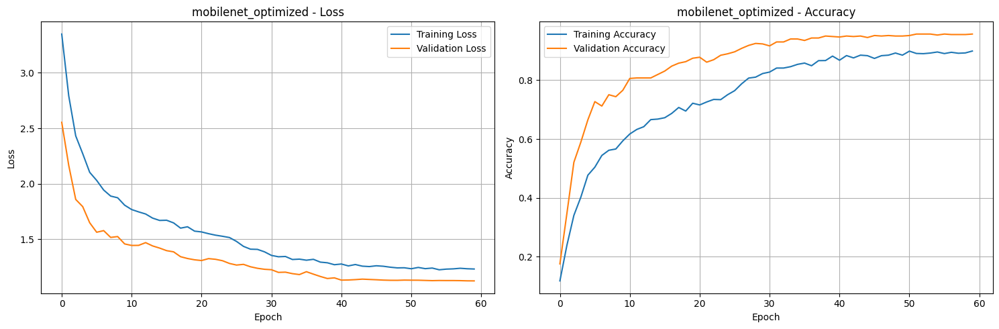


MOBILENET TRAINING COMPLETED SUCCESSFULLY!


In [11]:
def train_model_with_augmentation(model, model_name, X_train, y_train, X_val, y_val, 
                                 use_augmentation=True, epochs=50, enhanced_training=False):
    
    callbacks_list = [
        callbacks.EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True, mode='max'),
        callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-7, verbose=1),
        callbacks.ModelCheckpoint(
            f'/kaggle/working/models/{model_name}_best.keras',
            monitor='val_accuracy',
            save_best_only=True,
            mode='max'
        ),
        EnhancedTrainingMonitor()
    ]
    
    if not use_augmentation:
        callbacks_list = [
            callbacks.EarlyStopping(
                monitor='val_accuracy', 
                patience=3, 
                restore_best_weights=True, 
                mode='max', 
                min_delta=0.002,  
                baseline=0.97  
            ),
            callbacks.ReduceLROnPlateau(
                monitor='val_loss', 
                factor=0.2, 
                patience=1,  
                min_lr=1e-8, 
                verbose=1, 
                min_delta=0.002
            ),
            callbacks.ModelCheckpoint(
                f'/kaggle/working/models/{model_name}_best.keras',
                monitor='val_accuracy',
                save_best_only=True,
                mode='max'
            ),
            EnhancedTrainingMonitor()
        ]
    
    if use_augmentation:
        train_datagen = create_augmentation_generator()
        train_generator = train_datagen.flow(X_train, y_train, batch_size=BATCH_SIZE)
        
        val_datagen = create_validation_generator()
        val_generator = val_datagen.flow(X_val, y_val, batch_size=BATCH_SIZE)
        
        history = model.fit(
            train_generator,
            epochs=epochs,
            validation_data=val_generator,
            callbacks=callbacks_list,
            class_weight=class_weight_dict,
            verbose=1
        )
    else:
        history = model.fit(
            X_train, y_train,
            batch_size=BATCH_SIZE,
            epochs=epochs,
            validation_data=(X_val, y_val),
            callbacks=callbacks_list,
            class_weight=class_weight_dict,
            verbose=1,
            validation_freq=1,
            shuffle=True
        )
    
    return history, model

def train_mobilenet_with_optimized_strategy(model, model_name, X_train, y_train, X_val, y_val, 
                                          use_augmentation=True, epochs=80):
    
    print("=" * 60)
    print("PHASE 1: Conservative training (Most layers frozen)")
    print("=" * 60)
    
    callbacks_phase1 = [
        callbacks.EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True, mode='max'),
        callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=4, min_lr=1e-7, verbose=1),
        callbacks.ModelCheckpoint(
            f'/kaggle/working/models/{model_name}_phase1_best.keras',
            monitor='val_accuracy',
            save_best_only=True,
            save_weights_only=False,
            mode='max'
        ),
        EnhancedTrainingMonitor()
    ]
    
    model.compile(
        optimizer=optimizers.Adam(learning_rate=1e-4),
        loss=categorical_crossentropy_with_smoothing,
        metrics=['accuracy']
    )
    
    if use_augmentation:
        train_datagen = create_augmentation_generator()
        train_generator = train_datagen.flow(X_train, y_train, batch_size=BATCH_SIZE)
        val_datagen = create_validation_generator()
        val_generator = val_datagen.flow(X_val, y_val, batch_size=BATCH_SIZE)
        
        history_phase1 = model.fit(
            train_generator,
            epochs=min(epochs//2, 25),  
            validation_data=val_generator,
            callbacks=callbacks_phase1,
            class_weight=class_weight_dict,
            verbose=1
        )
    else:
        history_phase1 = model.fit(
            X_train, y_train,
            batch_size=BATCH_SIZE,
            epochs=min(epochs//2, 25),
            validation_data=(X_val, y_val),
            callbacks=callbacks_phase1,
            class_weight=class_weight_dict,
            verbose=1
        )
    
    best_val_acc_phase1 = max(history_phase1.history['val_accuracy'])
    if best_val_acc_phase1 < 0.5:  
        print(f"\nPhase 1 performance ({best_val_acc_phase1:.4f}) is low. Extending Phase 1...")
        extended_epochs = min(15, epochs - len(history_phase1.history['loss']))
        if extended_epochs > 0:
            history_phase1_extended = model.fit(
                train_generator if use_augmentation else X_train,
                y_train if not use_augmentation else None,
                batch_size=BATCH_SIZE,
                epochs=extended_epochs,
                validation_data=(val_generator if use_augmentation else (X_val, y_val)),
                callbacks=callbacks_phase1,
                class_weight=class_weight_dict,
                verbose=1
            )
            for key in history_phase1.history:
                history_phase1.history[key].extend(history_phase1_extended.history[key])
    
    print("\n" + "=" * 60)
    print("PHASE 2: Selective fine-tuning (30 layers)")
    print("=" * 60)
    
    model = unfreeze_mobilenet_layers(model, unfreeze_layers=30, learning_rate=5e-5)
    
    callbacks_phase2 = [
        callbacks.EarlyStopping(monitor='val_accuracy', patience=8, restore_best_weights=True, mode='max'),
        callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-8, verbose=1),
        callbacks.ModelCheckpoint(
            f'/kaggle/working/models/{model_name}_best.keras',
            monitor='val_accuracy',
            save_best_only=True,
            save_weights_only=False,
            mode='max'
        ),
        EnhancedTrainingMonitor()
    ]
    
    remaining_epochs = epochs - len(history_phase1.history['loss'])
    if remaining_epochs > 0:
        if use_augmentation:
            history_phase2 = model.fit(
                train_generator,
                epochs=remaining_epochs,
                validation_data=val_generator,
                callbacks=callbacks_phase2,
                class_weight=class_weight_dict,
                verbose=1
            )
        else:
            history_phase2 = model.fit(
                X_train, y_train,
                batch_size=BATCH_SIZE,
                epochs=remaining_epochs,
                validation_data=(X_val, y_val),
                callbacks=callbacks_phase2,
                class_weight=class_weight_dict,
                verbose=1
            )
        
        combined_history = {
            'loss': history_phase1.history['loss'] + history_phase2.history['loss'],
            'accuracy': history_phase1.history['accuracy'] + history_phase2.history['accuracy'],
            'val_loss': history_phase1.history['val_loss'] + history_phase2.history['val_loss'],
            'val_accuracy': history_phase1.history['val_accuracy'] + history_phase2.history['val_accuracy']
        }
    else:
        combined_history = history_phase1.history
    
    return combined_history, model

print("Training MobileNet with OPTIMIZED strategy and augmentation...")
start_time = time.time()
mobilenet_history_aug, mobilenet_model_aug_trained = train_mobilenet_with_optimized_strategy(
    mobilenet_model, 'mobilenet_optimized', X_train, y_train_cat, X_val, y_val_cat, 
    use_augmentation=True, epochs=80
)
mobilenet_time_aug = time.time() - start_time

print("\n" + "=" * 60)
print("Training MobileNet without augmentation (Baseline)")
print("=" * 60)

mobilenet_model_noaug = build_mobilenet_model(num_classes=NUM_CLASSES)
mobilenet_model_noaug.compile(
    optimizer=optimizers.Adam(
        learning_rate=1e-4,
        beta_1=0.9,
        beta_2=0.999,
        epsilon=1e-07,
        clipnorm=0.5  
    ),
    loss=categorical_crossentropy_with_smoothing,
    metrics=['accuracy']
)

start_time = time.time()
mobilenet_history_noaug, mobilenet_model_noaug_trained = train_model_with_augmentation(
    mobilenet_model_noaug, 'mobilenet_noaug', X_train, y_train_cat, X_val, y_val_cat,
    use_augmentation=False, epochs=50, enhanced_training=False
)
mobilenet_time_noaug = time.time() - start_time

if isinstance(mobilenet_history_aug, dict):
    mobilenet_train_acc_aug = mobilenet_history_aug['accuracy']
    mobilenet_val_acc_aug = mobilenet_history_aug['val_accuracy']
else:
    mobilenet_train_acc_aug = mobilenet_history_aug.history['accuracy']
    mobilenet_val_acc_aug = mobilenet_history_aug.history['val_accuracy']

if isinstance(mobilenet_history_noaug, dict):
    mobilenet_train_acc_noaug = mobilenet_history_noaug['accuracy']
    mobilenet_val_acc_noaug = mobilenet_history_noaug['val_accuracy']
else:
    mobilenet_train_acc_noaug = mobilenet_history_noaug.history['accuracy']
    mobilenet_val_acc_noaug = mobilenet_history_noaug.history['val_accuracy']


best_val_epoch_aug = mobilenet_val_acc_aug.index(max(mobilenet_val_acc_aug))
best_train_acc_aug = mobilenet_train_acc_aug[best_val_epoch_aug]

best_val_epoch_noaug = mobilenet_val_acc_noaug.index(max(mobilenet_val_acc_noaug))
best_train_acc_noaug = mobilenet_train_acc_noaug[best_val_epoch_noaug]

if max(mobilenet_val_acc_aug) >= max(mobilenet_val_acc_noaug):
    best_mobilenet_model = mobilenet_model_aug_trained
    best_mobilenet_history = mobilenet_history_aug
    best_mobilenet_time = mobilenet_time_aug
    best_mobilenet_type = "with OPTIMIZED augmentation strategy"
    best_train_acc = best_train_acc_aug
    best_val_acc = max(mobilenet_val_acc_aug)
else:
    best_mobilenet_model = mobilenet_model_noaug_trained
    best_mobilenet_history = mobilenet_history_noaug
    best_mobilenet_time = mobilenet_time_noaug
    best_mobilenet_type = "without augmentation"
    best_train_acc = best_train_acc_noaug
    best_val_acc = max(mobilenet_val_acc_noaug)

print(f"\n" + "=" * 60)
print("MOBILENET TRAINING SUMMARY")
print("=" * 60)
print(f"Best model: {best_mobilenet_type}")
print(f"Best training accuracy: {best_train_acc:.4f}")
print(f"Best validation accuracy: {best_val_acc:.4f}")
print(f"Training time: {best_mobilenet_time:.2f} seconds")

final_accuracy = best_val_acc
if final_accuracy >= 0.80:
    assessment = "EXCELLENT"
elif final_accuracy >= 0.75:
    assessment = "VERY GOOD" 
elif final_accuracy >= 0.70:
    assessment = "GOOD"
elif final_accuracy >= 0.65:
    assessment = "MODERATE"
elif final_accuracy >= 0.60:
    assessment = "FAIR"
else:
    assessment = "NEEDS IMPROVEMENT"

print(f"Performance assessment: {assessment}")

class CombinedHistory:
    def __init__(self, history_data):
        if isinstance(history_data, dict):
            self.history = history_data
        else:
            self.history = history_data.history

mobilenet_keras_history = CombinedHistory(best_mobilenet_history)

plot_learning_curves(mobilenet_keras_history, 'mobilenet_optimized')

print("\n" + "=" * 60)
print("MOBILENET TRAINING COMPLETED SUCCESSFULLY!")
print("=" * 60)

# Cell 12: Model 3 - Inception v1 (PyTorch) Implementation

In [12]:
from torchinfo import summary  # Add this import at the top of the function

class PyTorchFaceDataset(Dataset):
    def __init__(self, images, labels, transform=None):
        self.images = images
        self.labels = labels
        self.transform = transform
        
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        image = self.images[idx]
        label = self.labels[idx]
        
        image = Image.fromarray(image.astype('uint8'))
        
        if self.transform:
            image = self.transform(image)
            
        return image, label

train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

def prepare_pytorch_data(X_train, y_train, X_val, y_val, X_test, y_test):
    y_train_int = np.argmax(y_train, axis=1)
    y_val_int = np.argmax(y_val, axis=1)
    y_test_int = np.argmax(y_test, axis=1)
    
    train_dataset = PyTorchFaceDataset(X_train, y_train_int, train_transform)
    val_dataset = PyTorchFaceDataset(X_val, y_val_int, val_transform)
    test_dataset = PyTorchFaceDataset(X_test, y_test_int, val_transform)
    
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)
    
    return train_loader, val_loader, test_loader, y_test_int

train_loader, val_loader, test_loader, y_test_int_pytorch = prepare_pytorch_data(
    X_train, y_train_cat, X_val, y_val_cat, X_test, y_test_cat
)

class InceptionV1(nn.Module):
    def __init__(self, num_classes=14):
        super(InceptionV1, self).__init__()
        self.backbone = models_torch.googlenet(weights=GoogLeNet_Weights.IMAGENET1K_V1)
        
        in_features = self.backbone.fc.in_features
        self.backbone.fc = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(in_features, 512),
            nn.ReLU(inplace=True),
            nn.BatchNorm1d(512),
            nn.Dropout(0.3),
            nn.Linear(512, num_classes)
        )
        
    def forward(self, x):
        return self.backbone(x)

def train_pytorch_model(model, train_loader, val_loader, num_epochs=50, use_augmentation=True):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)
    
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-4)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, factor=0.5)
    
    train_losses = []
    train_accs = []
    val_losses = []
    val_accs = []
    
    best_val_acc = 0.0
    patience_counter = 0
    
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        running_corrects = 0
        total_samples = 0
        
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            running_corrects += torch.sum(preds == labels.data)
            total_samples += inputs.size(0)
        
        epoch_loss = running_loss / total_samples
        epoch_acc = running_corrects.double() / total_samples
        
        model.eval()
        val_running_loss = 0.0
        val_running_corrects = 0
        val_total_samples = 0
        
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                
                val_running_loss += loss.item() * inputs.size(0)
                _, preds = torch.max(outputs, 1)
                val_running_corrects += torch.sum(preds == labels.data)
                val_total_samples += inputs.size(0)
        
        val_epoch_loss = val_running_loss / val_total_samples
        val_epoch_acc = val_running_corrects.double() / val_total_samples
        
        train_losses.append(epoch_loss)
        train_accs.append(epoch_acc.cpu().numpy())
        val_losses.append(val_epoch_loss)
        val_accs.append(val_epoch_acc.cpu().numpy())
        
        scheduler.step(val_epoch_loss)
        
        if val_epoch_acc > best_val_acc:
            best_val_acc = val_epoch_acc
            torch.save(model.state_dict(), '/kaggle/working/models/inceptionv1_best.pth')
            patience_counter = 0
        else:
            patience_counter += 1
            
        if patience_counter >= 6:
            print(f"Early stopping at epoch {epoch+1}")
            break
        
        
        acc_gap = epoch_acc - val_epoch_acc
        if acc_gap > 0.15:
            status = "⚠️ OVERFITTING"
        elif epoch_acc < 0.6 and val_epoch_acc < 0.6:
            status = "⚠️ UNDERFITTING"
        elif acc_gap < 0.05:
            status = "✅ WELL GENERALIZED"
        else:
            status = "🔄 TRAINING WELL"
            
        print(f'Epoch {epoch+1}/{num_epochs}: '
              f'Train Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f} | '
              f'Val Loss: {val_epoch_loss:.4f}, Val Acc: {val_epoch_acc:.4f} | {status}')
    
    history = {
        'loss': train_losses,
        'accuracy': train_accs,
        'val_loss': val_losses,
        'val_accuracy': val_accs
    }
    
    return history, model

def evaluate_pytorch_model(model, test_loader):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.eval()
    
    all_preds = []
    all_probs = []
    all_labels = []
    
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs = inputs.to(device)
            outputs = model(inputs)
            probs = torch.softmax(outputs, dim=1)
            _, preds = torch.max(outputs, 1)
            
            all_preds.extend(preds.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())
            all_labels.extend(labels.numpy())
    
    return np.array(all_preds), np.array(all_probs), np.array(all_labels)

def print_detailed_model_summary(model, input_size=(1, 3, 224, 224)):
    print("=" * 80)
    print("DETAILED INCEPTION V1 MODEL SUMMARY")
    print("=" * 80)
    
    try:
        # Use torchinfo summary with detailed output
        summary_str = str(summary(
            model, 
            input_size=input_size, 
            col_names=["input_size", "output_size", "num_params", "trainable"],
            col_width=20,
            row_settings=["var_names"]
        ))
        
        # Split the summary into lines and print
        lines = summary_str.split('\n')
        for line in lines:
            print(line)
        
        # Also print additional statistics
        print("\n" + "=" * 80)
        print("MODEL STATISTICS")
        print("=" * 80)
        
        total_params = 0
        trainable_params = 0
        for name, param in model.named_parameters():
            if param.requires_grad:
                trainable_params += param.numel()
            total_params += param.numel()
        
        print(f"Total Parameters: {total_params:,}")
        print(f"Trainable Parameters: {trainable_params:,}")
        print(f"Non-trainable Parameters: {total_params - trainable_params:,}")
        print(f"Trainable Ratio: {(trainable_params/total_params*100):.2f}%")
        
    except Exception as e:
        print(f"Error using torchinfo: {e}")
        print("\nUsing alternative summary method...")
        
        print("\nLayer-by-layer breakdown:")
        print("-" * 120)
        print(f"{'Layer Name':<40} {'Type':<25} {'Output Shape':<25} {'Param #':<15} {'Trainable'}")
        print("-" * 120)
        
        total_params = 0
        trainable_params = 0
        
        for name, module in model.named_modules():
            if name: 
                params = sum(p.numel() for p in module.parameters())
                trainable = any(p.requires_grad for p in module.parameters())
                total_params += params
                if trainable:
                    trainable_params += params
                
                # Get module type
                module_type = str(type(module)).split('.')[-1].split("'")[0]
                
                # Try to get output shape
                try:
                    # Create a dummy input
                    dummy_input = torch.randn(input_size)
                    with torch.no_grad():
                        output = module(dummy_input)
                    if isinstance(output, tuple):
                        out_shape = str([tuple(o.shape) for o in output])
                    else:
                        out_shape = str(tuple(output.shape))
                except:
                    out_shape = "N/A"
                
                print(f"{name:<40} {module_type:<25} {out_shape:<25} {params:<15,} {trainable}")
        
        print("-" * 120)
        print(f"\nTotal params: {total_params:,}")
        print(f"Trainable params: {trainable_params:,}")
        print(f"Non-trainable params: {total_params - trainable_params:,}")
        print(f"Trainable Ratio: {(trainable_params/total_params*100):.2f}%")

# Create and print model summary
inception_model = InceptionV1(num_classes=NUM_CLASSES)
print_detailed_model_summary(inception_model)


Downloading: "https://download.pytorch.org/models/googlenet-1378be20.pth" to /root/.cache/torch/hub/checkpoints/googlenet-1378be20.pth
100%|██████████| 49.7M/49.7M [00:00<00:00, 56.8MB/s]


DETAILED INCEPTION V1 MODEL SUMMARY
Layer (type (var_name))                       Input Shape          Output Shape         Param #              Trainable
InceptionV1 (InceptionV1)                     [1, 3, 224, 224]     [1, 14]              --                   True
├─GoogLeNet (backbone)                        [1, 3, 224, 224]     [1, 14]              --                   True
│    └─BasicConv2d (conv1)                    [1, 3, 224, 224]     [1, 64, 112, 112]    --                   True
│    │    └─Conv2d (conv)                     [1, 3, 224, 224]     [1, 64, 112, 112]    9,408                True
│    │    └─BatchNorm2d (bn)                  [1, 64, 112, 112]    [1, 64, 112, 112]    128                  True
│    └─MaxPool2d (maxpool1)                   [1, 64, 112, 112]    [1, 64, 56, 56]      --                   --
│    └─BasicConv2d (conv2)                    [1, 64, 56, 56]      [1, 64, 56, 56]      --                   True
│    │    └─Conv2d (conv)                     [1,

# Cell 13: Inception v1 Training

Training Inception v1 with augmentation...
Epoch 1/50: Train Loss: 2.2979, Train Acc: 0.2416 | Val Loss: 1.6402, Val Acc: 0.4807 | ⚠️ UNDERFITTING
Epoch 2/50: Train Loss: 1.4022, Train Acc: 0.5542 | Val Loss: 0.8874, Val Acc: 0.7672 | ✅ WELL GENERALIZED
Epoch 3/50: Train Loss: 0.8339, Train Acc: 0.7674 | Val Loss: 0.5115, Val Acc: 0.8811 | ✅ WELL GENERALIZED
Epoch 4/50: Train Loss: 0.5465, Train Acc: 0.8532 | Val Loss: 0.2967, Val Acc: 0.9313 | ✅ WELL GENERALIZED
Epoch 5/50: Train Loss: 0.3486, Train Acc: 0.9110 | Val Loss: 0.1897, Val Acc: 0.9615 | ✅ WELL GENERALIZED
Epoch 6/50: Train Loss: 0.2069, Train Acc: 0.9569 | Val Loss: 0.1368, Val Acc: 0.9715 | ✅ WELL GENERALIZED
Epoch 7/50: Train Loss: 0.1922, Train Acc: 0.9551 | Val Loss: 0.1072, Val Acc: 0.9765 | ✅ WELL GENERALIZED
Epoch 8/50: Train Loss: 0.1457, Train Acc: 0.9645 | Val Loss: 0.0876, Val Acc: 0.9799 | ✅ WELL GENERALIZED
Epoch 9/50: Train Loss: 0.1160, Train Acc: 0.9745 | Val Loss: 0.0664, Val Acc: 0.9816 | ✅ WELL GENERALIZ

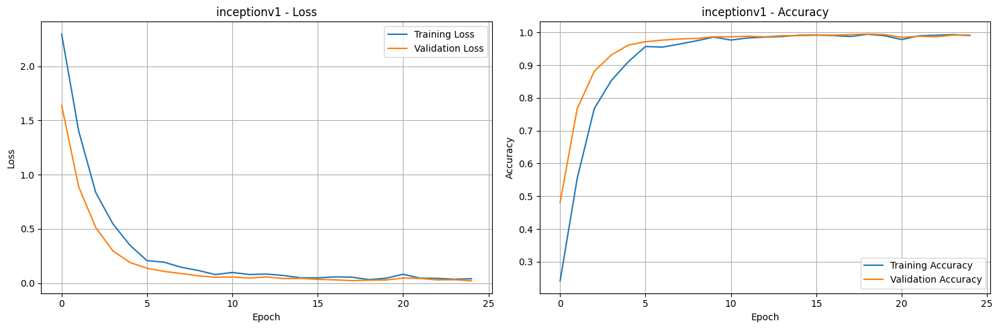

In [13]:
print("Training Inception v1 with augmentation...")
inception_model = InceptionV1(num_classes=NUM_CLASSES)

start_time = time.time()
inception_history_aug, trained_inception_model = train_pytorch_model(
    inception_model, train_loader, val_loader, num_epochs=50, use_augmentation=True
)
inception_time_aug = time.time() - start_time


if isinstance(inception_history_aug, dict):
    train_acc_aug = inception_history_aug.get('train_acc', [])
    val_acc_aug = inception_history_aug.get('val_acc', [])
    
    if not train_acc_aug:
        train_acc_aug = inception_history_aug.get('train_accuracy', [])
    if not val_acc_aug:
        val_acc_aug = inception_history_aug.get('val_accuracy', [])
    if not train_acc_aug:
        train_acc_aug = inception_history_aug.get('accuracy', [])
    if not val_acc_aug:
        val_acc_aug = inception_history_aug.get('val_accuracy', [])
    
    if train_acc_aug and val_acc_aug:
        best_epoch = val_acc_aug.index(max(val_acc_aug))
        best_train_acc = train_acc_aug[best_epoch]
        best_val_acc = val_acc_aug[best_epoch]
    else:
        best_train_acc = max(train_acc_aug) if train_acc_aug else 0
        best_val_acc = max(val_acc_aug) if val_acc_aug else 0
        best_epoch = 0
else:
    best_train_acc = 0
    best_val_acc = 0
    best_epoch = 0

best_inception_model = trained_inception_model
best_inception_history = inception_history_aug
best_inception_time = inception_time_aug
best_inception_type = "with augmentation"

print(f"\nBest Inception v1 model: {best_inception_type}")
print(f"Best training accuracy: {best_train_acc:.4f}")
print(f"Best validation accuracy: {best_val_acc:.4f}")
print(f"Epoch with best validation accuracy: {best_epoch + 1}")
print(f"Training time: {best_inception_time:.2f} seconds")

if best_val_acc >= 0.80:
    assessment = "EXCELLENT"
elif best_val_acc >= 0.70:
    assessment = "VERY GOOD"
elif best_val_acc >= 0.60:
    assessment = "GOOD"
elif best_val_acc >= 0.50:
    assessment = "MODERATE"
elif best_val_acc >= 0.30:
    assessment = "FAIR"
else:
    assessment = "NEEDS IMPROVEMENT"

print(f"Performance assessment: {assessment}")

class PyTorchHistory:
    def __init__(self, history_dict):
        self.history = history_dict

inception_keras_history = PyTorchHistory(best_inception_history)

plot_learning_curves(inception_keras_history, 'inceptionv1')

# Cell 14: Model 4 - Custom VGG-19 Implementation

In [14]:
def build_stable_vgg(input_shape=(224, 224, 3), num_classes=14):
    
    model = models.Sequential([
        layers.Conv2D(32, (3, 3), activation='relu', padding='same', 
                     kernel_initializer='he_normal', input_shape=input_shape),
        layers.BatchNormalization(),
        layers.Conv2D(32, (3, 3), activation='relu', padding='same',
                     kernel_initializer='he_normal'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        
     
        layers.Conv2D(64, (3, 3), activation='relu', padding='same',
                     kernel_initializer='he_normal'),
        layers.BatchNormalization(),
        layers.Conv2D(64, (3, 3), activation='relu', padding='same',
                     kernel_initializer='he_normal'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        
        
        layers.Conv2D(128, (3, 3), activation='relu', padding='same',
                     kernel_initializer='he_normal'),
        layers.BatchNormalization(),
        layers.Conv2D(128, (3, 3), activation='relu', padding='same',
                     kernel_initializer='he_normal'),
        layers.BatchNormalization(),
        layers.Conv2D(128, (3, 3), activation='relu', padding='same',
                     kernel_initializer='he_normal'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        
        
        layers.Conv2D(256, (3, 3), activation='relu', padding='same',
                     kernel_initializer='he_normal'),
        layers.BatchNormalization(),
        layers.Conv2D(256, (3, 3), activation='relu', padding='same',
                     kernel_initializer='he_normal'),
        layers.BatchNormalization(),
        layers.Conv2D(256, (3, 3), activation='relu', padding='same',
                     kernel_initializer='he_normal'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        
        
        layers.Conv2D(256, (3, 3), activation='relu', padding='same',
                     kernel_initializer='he_normal'),
        layers.BatchNormalization(),
        layers.Conv2D(256, (3, 3), activation='relu', padding='same',
                     kernel_initializer='he_normal'),
        layers.BatchNormalization(),
        layers.GlobalAveragePooling2D(),
        
        layers.Dense(512, activation='relu', kernel_initializer='he_normal'),
        layers.BatchNormalization(),
        layers.Dropout(0.3),
        layers.Dense(256, activation='relu', kernel_initializer='he_normal'),
        layers.BatchNormalization(),
        layers.Dropout(0.2),
        layers.Dense(num_classes, activation='softmax')
    ])
    
    return model

vgg_model = build_stable_vgg(num_classes=NUM_CLASSES)
vgg_model.compile(
    optimizer=optimizers.Adam(
        learning_rate=1e-4,  
        beta_1=0.9,
        beta_2=0.999,
        epsilon=1e-07,
        clipnorm=1.0  
    ),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print("Stable VGG Model Summary:")
vgg_model.summary()

total_params = vgg_model.count_params()
trainable_params = sum([tf.keras.backend.count_params(w) for w in vgg_model.trainable_weights])
print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")
print(f"Non-trainable parameters: {total_params - trainable_params:,}")

Stable VGG Model Summary:


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 224, 224, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 112, 112, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_15          │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_16          │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_17          │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 28, 28, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_18          │ (None, 28, 28, 256)    │         1,02

 Total params: 3,367,086 (12.84 MB)

 Trainable params: 3,361,838 (12.82 MB)

 Non-trainable params: 5,248 (20.50 KB)

Total parameters: 3,367,086
Trainable parameters: 3,361,838
Non-trainable parameters: 5,248


# Cell 15: VGG-19 Training

In [15]:
def train_model_with_augmentation(model, model_name, X_train, y_train, X_val, y_val, 
                                 use_augmentation=True, epochs=50, enhanced_training=False):
    
    callbacks_list = [
        callbacks.EarlyStopping(
            monitor='val_accuracy', 
            patience=12,  
            restore_best_weights=True, 
            mode='max',
            min_delta=0.001
        ),
        callbacks.ReduceLROnPlateau(
            monitor='val_loss', 
            factor=0.5, 
            patience=5,  
            min_lr=1e-7, 
            verbose=1,
            min_delta=0.001
        ),
        callbacks.ModelCheckpoint(
            f'/kaggle/working/models/{model_name}_best.keras',
            monitor='val_accuracy',
            save_best_only=True,
            mode='max'
        ),
        EnhancedTrainingMonitor()
    ]
    
    if not use_augmentation:
        callbacks_list = [
            callbacks.EarlyStopping(
                monitor='val_accuracy', 
                patience=8,
                restore_best_weights=True, 
                mode='max', 
                min_delta=0.001
            ),
            callbacks.ReduceLROnPlateau(
                monitor='val_loss', 
                factor=0.5,
                patience=4,
                min_lr=1e-7, 
                verbose=1,
                min_delta=0.001
            ),
            callbacks.ModelCheckpoint(
                f'/kaggle/working/models/{model_name}_best.keras',
                monitor='val_accuracy',
                save_best_only=True,
                mode='max'
            ),
            EnhancedTrainingMonitor()
        ]
    
    if use_augmentation:
        train_datagen = create_augmentation_generator()
        train_generator = train_datagen.flow(X_train, y_train, batch_size=32)
        
        val_datagen = create_validation_generator()
        val_generator = val_datagen.flow(X_val, y_val, batch_size=32)
        
        history = model.fit(
            train_generator,
            epochs=epochs,
            validation_data=val_generator,
            callbacks=callbacks_list,
            class_weight=class_weight_dict,
            verbose=1
        )
    else:
        history = model.fit(
            X_train, y_train,
            batch_size=32,
            epochs=epochs,
            validation_data=(X_val, y_val),
            callbacks=callbacks_list,
            class_weight=class_weight_dict,
            verbose=1,
            validation_freq=1,
            shuffle=True
        )
    
    return history, model

Training Stable VGG with augmentation...
Epoch 1/50


2025-12-08 18:33:59.163514: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng19{k2=2} for conv (f16[32,3,3,32]{3,2,1,0}, u8[0]{0}) custom-call(f16[32,224,224,32]{3,2,1,0}, f16[32,224,224,32]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=b01f_o01i->b01f, custom_call_target="__cudnn$convBackwardFilter", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]} is taking a while...
2025-12-08 18:34:00.366860: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 2.203453783s
Trying algorithm eng19{k2=2} for conv (f16[32,3,3,32]{3,2,1,0}, u8[0]{0}) custom-call(f16[32,224,224,32]{3,2,1,0}, f16[32,224,224,32]{3,2,1,0}), window={size=3x3 pad=1_1x1_1}, dim_labels=b01f_o01i->b01f, custom_call_target="__cudnn$convBackwardFilter", backend_config={"cudnn_conv_backend_con

88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 531ms/step - accuracy: 0.1038 - loss: 3.3080Epoch  1: Train Acc 0.1353, Val Acc 0.1039 | Gap: 0.031 | Loss Ratio: 1.03 | 👍 GOOD PROGRESS
   Recommendation: Continue training
88/88 ━━━━━━━━━━━━━━━━━━━━ 138s 667ms/step - accuracy: 0.1041 - loss: 3.3054 - val_accuracy: 0.1039 - val_loss: 3.1792 - learning_rate: 1.0000e-04
Epoch 2/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step - accuracy: 0.2158 - loss: 2.6526Epoch  2: Train Acc 0.2089, Val Acc 0.1776 | Gap: 0.031 | Loss Ratio: 0.92 | 👍 GOOD PROGRESS
   Recommendation: Continue training
88/88 ━━━━━━━━━━━━━━━━━━━━ 33s 371ms/step - accuracy: 0.2158 - loss: 2.6525 - val_accuracy: 0.1776 - val_loss: 2.4393 - learning_rate: 1.0000e-04
Epoch 3/50
88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step - accuracy: 0.2125 - loss: 2.5418Epoch  3: Train Acc 0.2146, Val Acc 0.2127 | Gap: 0.002 | Loss Ratio: 1.05 | ✅ EXCELLENT GENERALIZATION
   Recommendation: Optimal training
88/88 ━━━━━━━━━━━━━━━━━━━━ 33s 376ms/step - accuracy: 0.2125 - 

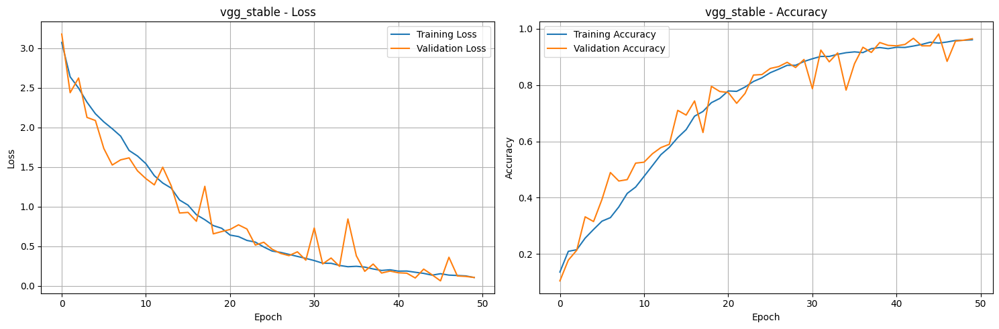

In [16]:
print("Training Stable VGG with augmentation...")
start_time = time.time()

vgg_model.compile(
    optimizer=optimizers.Adam(
        learning_rate=1e-4,
        clipnorm=1.0
    ),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

vgg_history_aug, vgg_model_aug_trained = train_model_with_augmentation(
    vgg_model, 'vgg_stable', X_train, y_train_cat, X_val, y_val_cat, 
    use_augmentation=True, epochs=50
)
vgg_time_aug = time.time() - start_time

print("\nTraining Stable VGG without augmentation...")
vgg_model_noaug = build_stable_vgg(num_classes=NUM_CLASSES)

vgg_model_noaug.compile(
    optimizer=optimizers.Adam(
        learning_rate=1e-4,  
        clipnorm=1.0,
        beta_1=0.9,
        beta_2=0.999,
        epsilon=1e-07
    ),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

noaug_callbacks = [
    callbacks.EarlyStopping(
        monitor='val_accuracy', 
        patience=5,  
        restore_best_weights=True, 
        mode='max',
        min_delta=0.002,
        baseline=0.85  
    ),
    callbacks.ReduceLROnPlateau(
        monitor='val_loss', 
        factor=0.3,  
        patience=2,  
        min_lr=1e-7, 
        verbose=1,
        min_delta=0.005
    ),
    callbacks.ModelCheckpoint(
        f'/kaggle/working/models/vgg_stable_noaug_best.keras',
        monitor='val_accuracy',
        save_best_only=True,
        mode='max'
    ),
    EnhancedTrainingMonitor()
]

start_time = time.time()
vgg_history_noaug = vgg_model_noaug.fit(
    X_train, y_train_cat,
    batch_size=32,
    epochs=30,  
    validation_data=(X_val, y_val_cat),
    callbacks=noaug_callbacks,
    class_weight=class_weight_dict,
    verbose=1,
    validation_freq=1,
    shuffle=True
)
vgg_model_noaug_trained = vgg_model_noaug
vgg_time_noaug = time.time() - start_time

if isinstance(vgg_history_aug, dict):
    vgg_train_acc_aug = vgg_history_aug['accuracy']
    vgg_val_acc_aug = vgg_history_aug['val_accuracy']
else:
    vgg_train_acc_aug = vgg_history_aug.history['accuracy']
    vgg_val_acc_aug = vgg_history_aug.history['val_accuracy']

if isinstance(vgg_history_noaug, dict):
    vgg_train_acc_noaug = vgg_history_noaug['accuracy']
    vgg_val_acc_noaug = vgg_history_noaug['val_accuracy']
else:
    vgg_train_acc_noaug = vgg_history_noaug.history['accuracy']
    vgg_val_acc_noaug = vgg_history_noaug.history['val_accuracy']


best_val_epoch_aug = vgg_val_acc_aug.index(max(vgg_val_acc_aug))
best_train_acc_aug = vgg_train_acc_aug[best_val_epoch_aug]

best_val_epoch_noaug = vgg_val_acc_noaug.index(max(vgg_val_acc_noaug))
best_train_acc_noaug = vgg_train_acc_noaug[best_val_epoch_noaug]

if max(vgg_val_acc_aug) >= max(vgg_val_acc_noaug):
    best_vgg_model = vgg_model_aug_trained
    best_vgg_history = vgg_history_aug
    best_vgg_time = vgg_time_aug
    best_vgg_type = "with augmentation"
    best_train_acc = best_train_acc_aug
else:
    best_vgg_model = vgg_model_noaug_trained
    best_vgg_history = vgg_history_noaug
    best_vgg_time = vgg_time_noaug
    best_vgg_type = "without augmentation"
    best_train_acc = best_train_acc_noaug

best_val_acc = max(max(vgg_val_acc_aug), max(vgg_val_acc_noaug))

print(f"\nBest Stable VGG model: {best_vgg_type}")
print(f"Best validation accuracy: {best_val_acc:.4f}")
print(f"Best training accuracy: {best_train_acc:.4f}")
print(f"Training time: {best_vgg_time:.2f} seconds")

final_accuracy = best_val_acc
if final_accuracy >= 0.80:
    assessment = "EXCELLENT"
elif final_accuracy >= 0.70:
    assessment = "VERY GOOD"
elif final_accuracy >= 0.60:
    assessment = "GOOD"
elif final_accuracy >= 0.50:
    assessment = "MODERATE"
elif final_accuracy >= 0.30:
    assessment = "FAIR"
else:
    assessment = "NEEDS IMPROVEMENT"

print(f"Performance assessment: {assessment}")

plot_learning_curves(best_vgg_history, 'vgg_stable')

# Cell 16: Model 5 - Vision Transformer (ViT) Implementation

In [17]:
!pip install vit-keras
from vit_keras import vit
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.regularizers import l2

NUM_CLASSES = 14

def build_improved_vit(num_classes=NUM_CLASSES, image_size=224):
  
    vit_model = vit.vit_b16(
        image_size=image_size,
        activation='softmax',
        pretrained=True,
        include_top=False,
        pretrained_top=False
    )
    
    for layer in vit_model.layers[:len(vit_model.layers)//2]:
        layer.trainable = False
    for layer in vit_model.layers[len(vit_model.layers)//2:]:
        layer.trainable = True
    
    inputs = layers.Input(shape=(image_size, image_size, 3))
    x = vit_model(inputs)
    
    x = layers.Dense(512, activation='gelu', 
                    kernel_regularizer=l2(1e-4))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    
    x = layers.Dense(256, activation='gelu', 
                    kernel_regularizer=l2(1e-4))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.3)(x)
    
   
    outputs = layers.Dense(num_classes, activation='softmax')(x)
    
    model = models.Model(inputs, outputs, name="improved_vit")
    return model

vit_model = build_improved_vit(NUM_CLASSES)

initial_learning_rate = 1e-4
lr_schedule = optimizers.schedules.CosineDecayRestarts(
    initial_learning_rate,
    first_decay_steps=500
)

vit_model.compile(
    optimizer=optimizers.AdamW(
        learning_rate=lr_schedule,
        weight_decay=1e-4,
        beta_1=0.9,
        beta_2=0.999,
        clipnorm=1.0
    ),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

vit_model.summary()

trainable_count = sum([tf.keras.backend.count_params(w) for w in vit_model.trainable_weights])
non_trainable_count = sum([tf.keras.backend.count_params(w) for w in vit_model.non_trainable_weights])
print(f"\nTrainable parameters: {trainable_count:,}")
print(f"Non-trainable parameters: {non_trainable_count:,}")
print(f"Total parameters: {trainable_count + non_trainable_count:,}")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.7/44.7 kB 3.2 MB/s eta 0:00:00
347502902/347502902 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


/usr/local/lib/python3.11/dist-packages/vit_keras/utils.py:85: UserWarning: Resizing position embeddings from 24, 24 to 14, 14
  warnings.warn(


Model: "improved_vit"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_23 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vit-b16 (Functional)            │ (None, 768)            │    85,798,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 512)            │       393,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_38          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_52 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_39          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_53 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 14)             │         3,598 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 86,330,382 (329.32 MB)

 Trainable params: 57,234,702 (218.33 MB)

 Non-trainable params: 29,095,680 (110.99 MB)


Trainable parameters: 57,234,702
Non-trainable parameters: 29,095,680
Total parameters: 86,330,382


# Cell 17: ViT Training

Training ViT with augmentation only...
Epoch 1/100
88/88 ━━━━━━━━━━━━━━━━━━━━ 145s 926ms/step - accuracy: 0.0847 - loss: 3.7293 - val_accuracy: 0.1223 - val_loss: 2.6663 - learning_rate: 1.0000e-04
Epoch 2/100
88/88 ━━━━━━━━━━━━━━━━━━━━ 43s 491ms/step - accuracy: 0.1150 - loss: 3.2993 - val_accuracy: 0.1658 - val_loss: 2.4612 - learning_rate: 1.0000e-04
Epoch 3/100
88/88 ━━━━━━━━━━━━━━━━━━━━ 37s 415ms/step - accuracy: 0.1575 - loss: 3.0935 - val_accuracy: 0.1407 - val_loss: 2.5152 - learning_rate: 1.0000e-04
Epoch 4/100
88/88 ━━━━━━━━━━━━━━━━━━━━ 42s 474ms/step - accuracy: 0.1644 - loss: 3.0103 - val_accuracy: 0.2563 - val_loss: 2.1586 - learning_rate: 1.0000e-04
Epoch 5/100
88/88 ━━━━━━━━━━━━━━━━━━━━ 37s 414ms/step - accuracy: 0.1903 - loss: 2.8502 - val_accuracy: 0.2345 - val_loss: 2.4535 - learning_rate: 1.0000e-04
Epoch 6/100
88/88 ━━━━━━━━━━━━━━━━━━━━ 43s 481ms/step - accuracy: 0.1966 - loss: 2.8462 - val_accuracy: 0.2781 - val_loss: 2.2024 - learning_rate: 1.0000e-04
Epoch 7/100


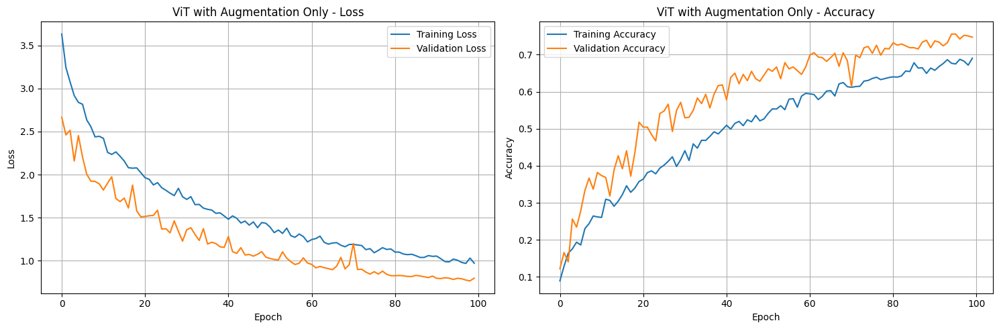

Model saved as '/kaggle/working/models/vit_final_aug_only.keras'


In [18]:
import time
from tensorflow.keras import callbacks
from tensorflow.keras import optimizers

print("Training ViT with augmentation only...")

vit_model.compile(
    optimizer=optimizers.Adam(
        learning_rate=1e-4,  
        beta_1=0.9,
        beta_2=0.999,
        epsilon=1e-08
    ),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

vit_callbacks = [
    callbacks.EarlyStopping(
        monitor='val_accuracy',
        patience=20,
        restore_best_weights=True,
        mode='max',
        min_delta=0.002,
        baseline=0.15
    ),
    callbacks.ModelCheckpoint(
        '/kaggle/working/models/vit_best_aug_only.keras',
        monitor='val_accuracy',
        save_best_only=True,
        mode='max'
    ),
    callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=5,
        min_lr=1e-6,
        verbose=1
    )
]

train_datagen = create_augmentation_generator()
train_generator = train_datagen.flow(X_train, y_train_cat, batch_size=32)
val_datagen = create_validation_generator()
val_generator = val_datagen.flow(X_val, y_val_cat, batch_size=32)

start_time = time.time()
vit_history_aug = vit_model.fit(
    train_generator,
    epochs=100,
    validation_data=val_generator,
    callbacks=vit_callbacks,
    class_weight=class_weight_dict,
    verbose=1
)
vit_time_aug = time.time() - start_time

vit_val_acc_aug = max(vit_history_aug.history['val_accuracy'])
vit_train_acc_aug = max(vit_history_aug.history['accuracy'])

print(f"\nViT trained on augmented data only:")
print(f"Best validation accuracy: {vit_val_acc_aug:.4f}")
print(f"Best training accuracy: {vit_train_acc_aug:.4f}")
print(f"Training time: {vit_time_aug:.2f} seconds")

final_accuracy = vit_val_acc_aug
if final_accuracy >= 0.60:
    assessment = "GOOD"
elif final_accuracy >= 0.40:
    assessment = "MODERATE"
elif final_accuracy >= 0.20:
    assessment = "FAIR"
else:
    assessment = "POOR - Consider alternative architecture or stronger augmentation"

print(f"Performance assessment: {assessment}")

plot_learning_curves(vit_history_aug, 'ViT with Augmentation Only')

vit_model.save('/kaggle/working/models/vit_final_aug_only.keras')
print("Model saved as '/kaggle/working/models/vit_final_aug_only.keras'")

best_vit_model = vit_model
best_vit_time = vit_time_aug
best_vit_history = vit_history_aug


# Cell 18: Model Evaluation and Metrics

Evaluating all models on test set...


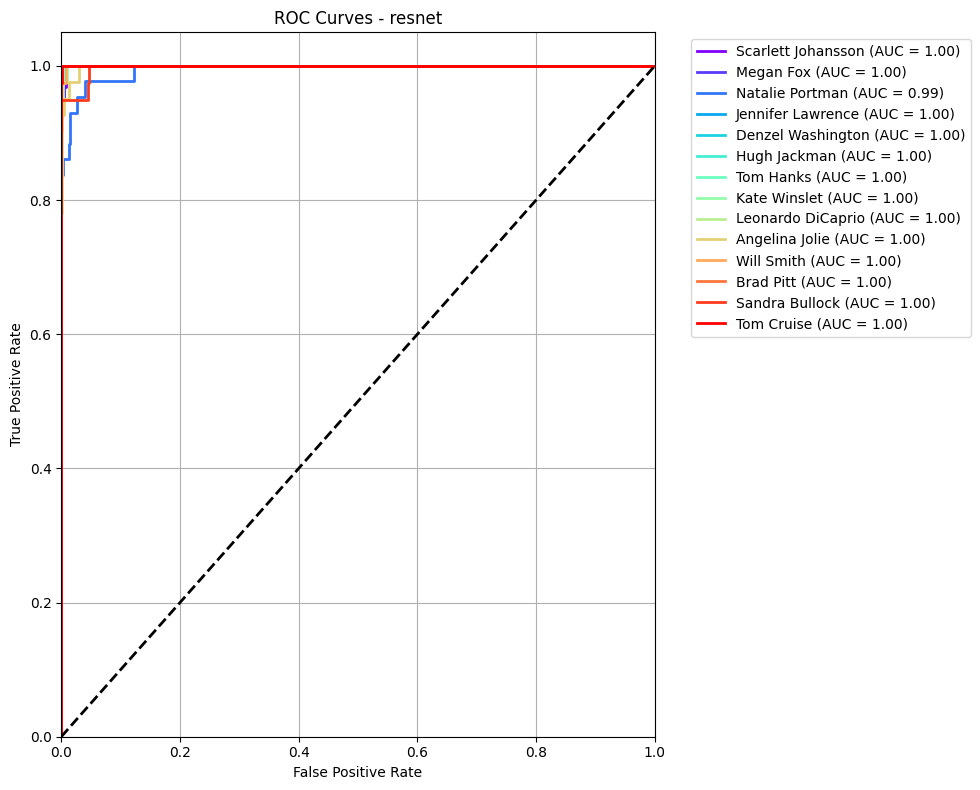

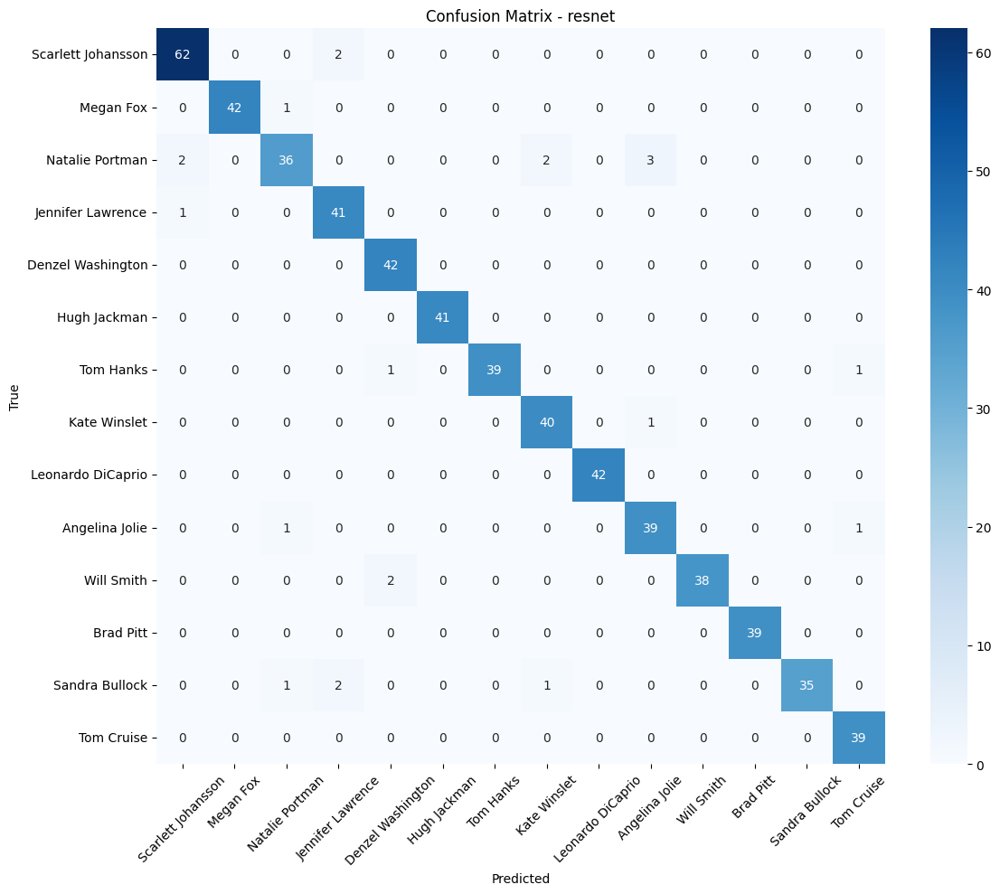

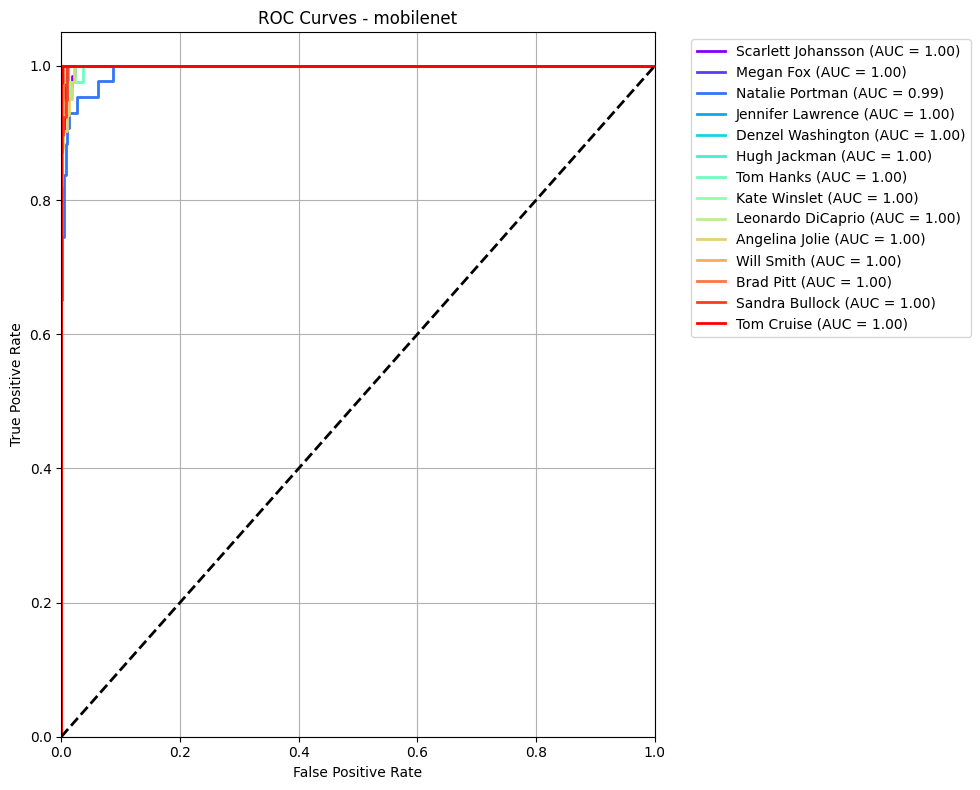

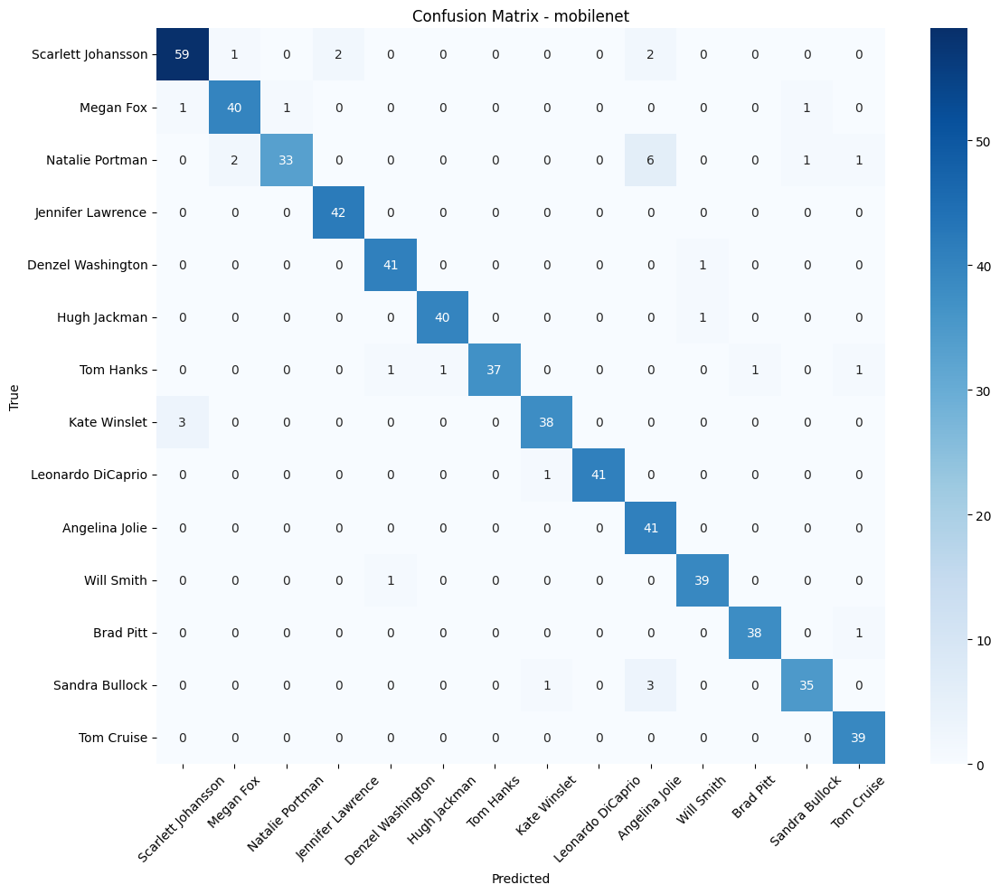

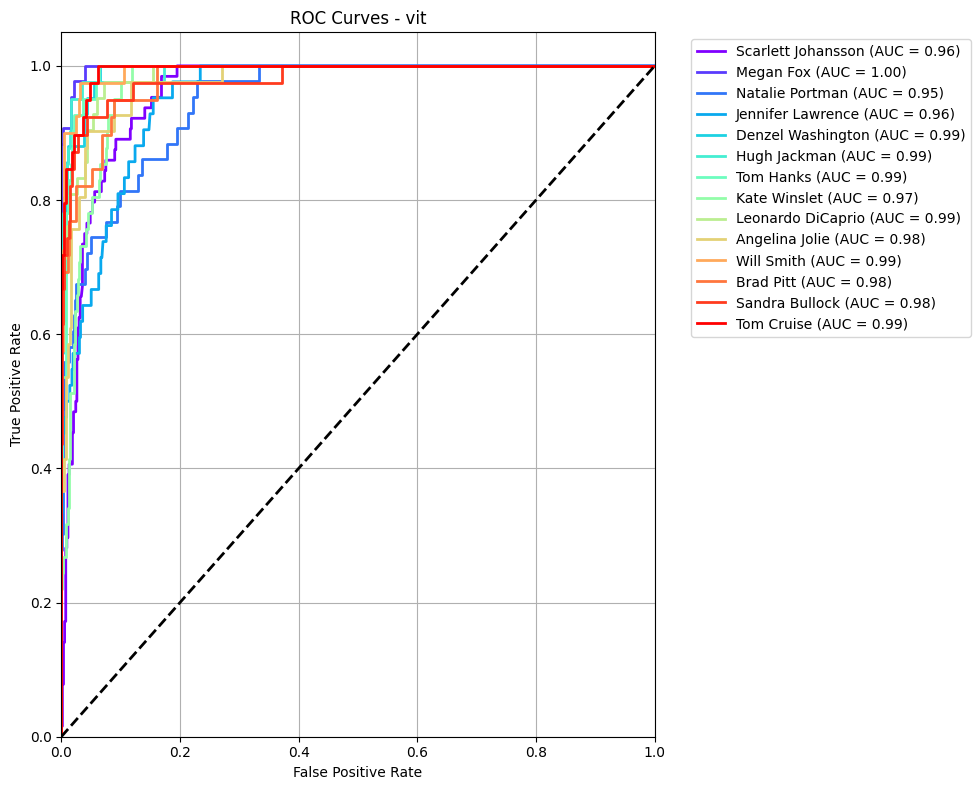

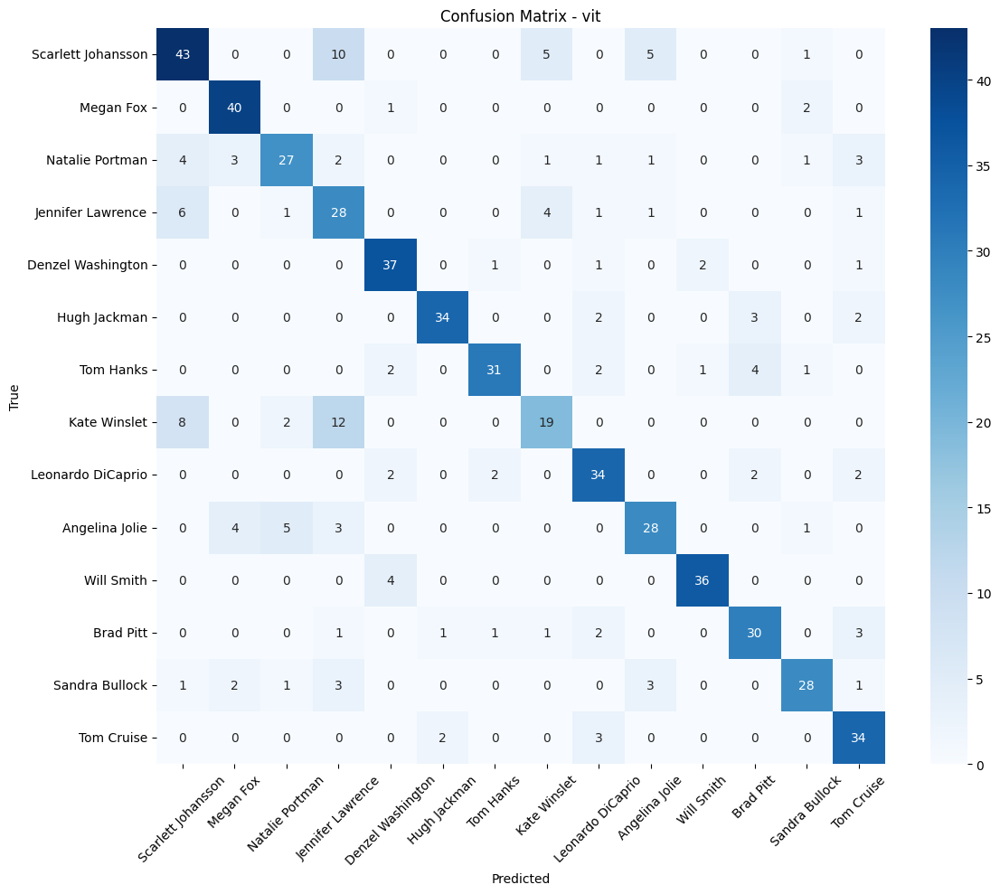

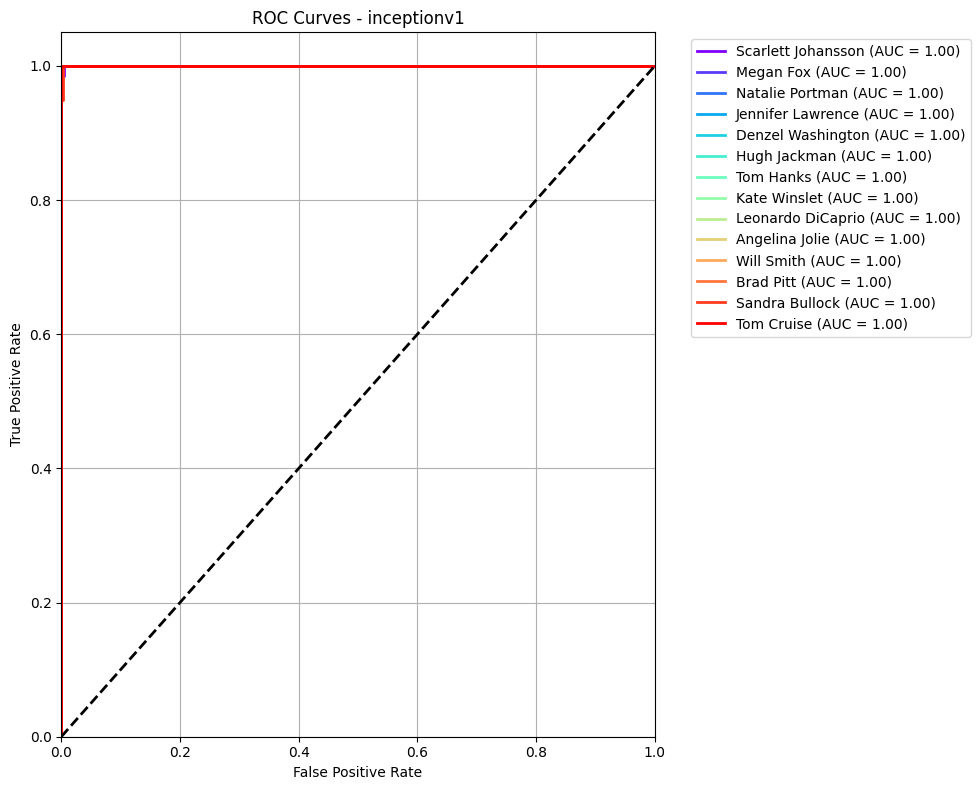

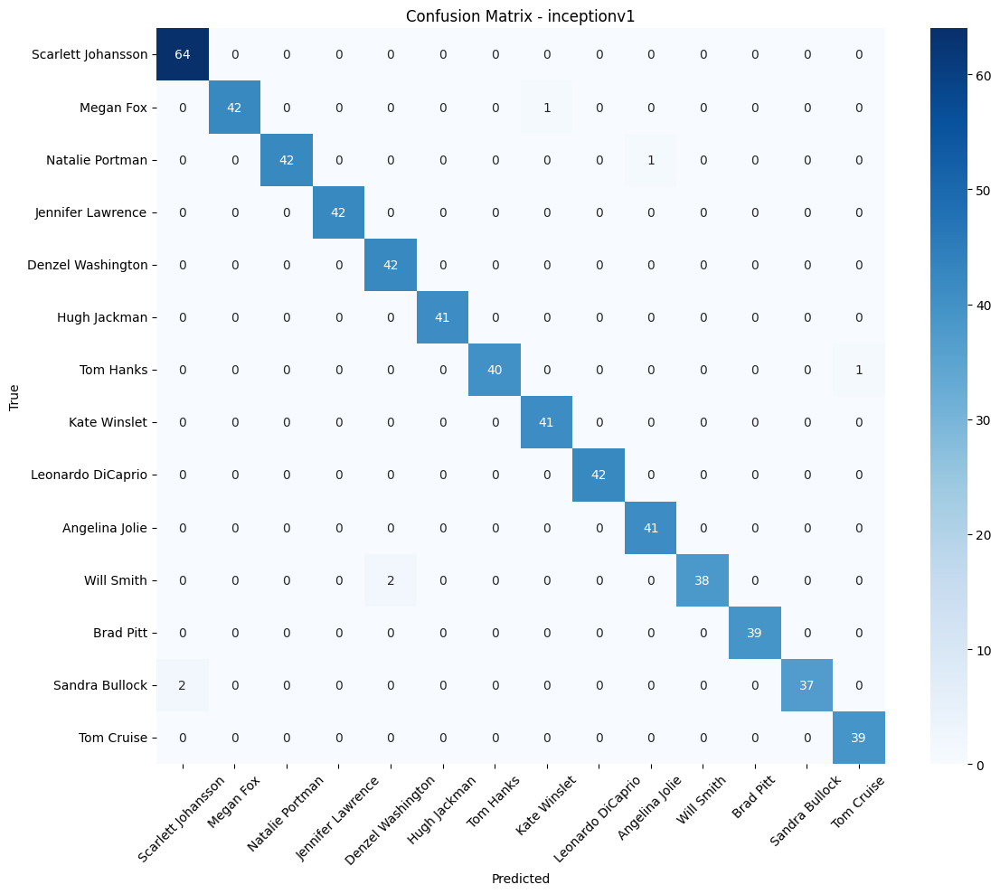

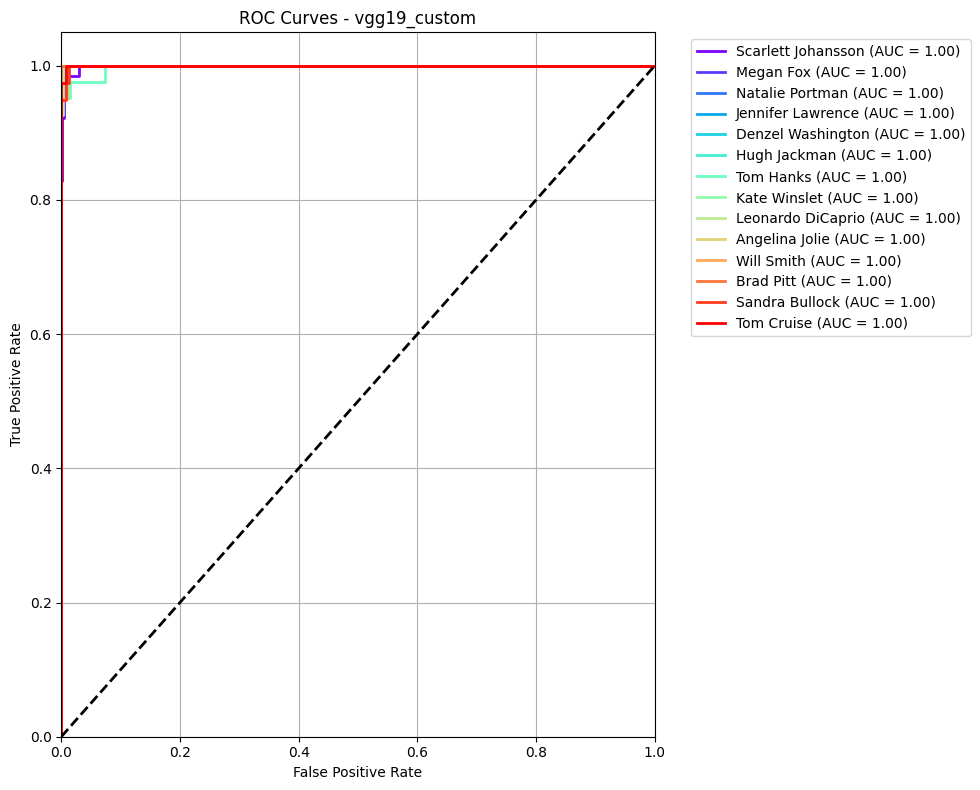

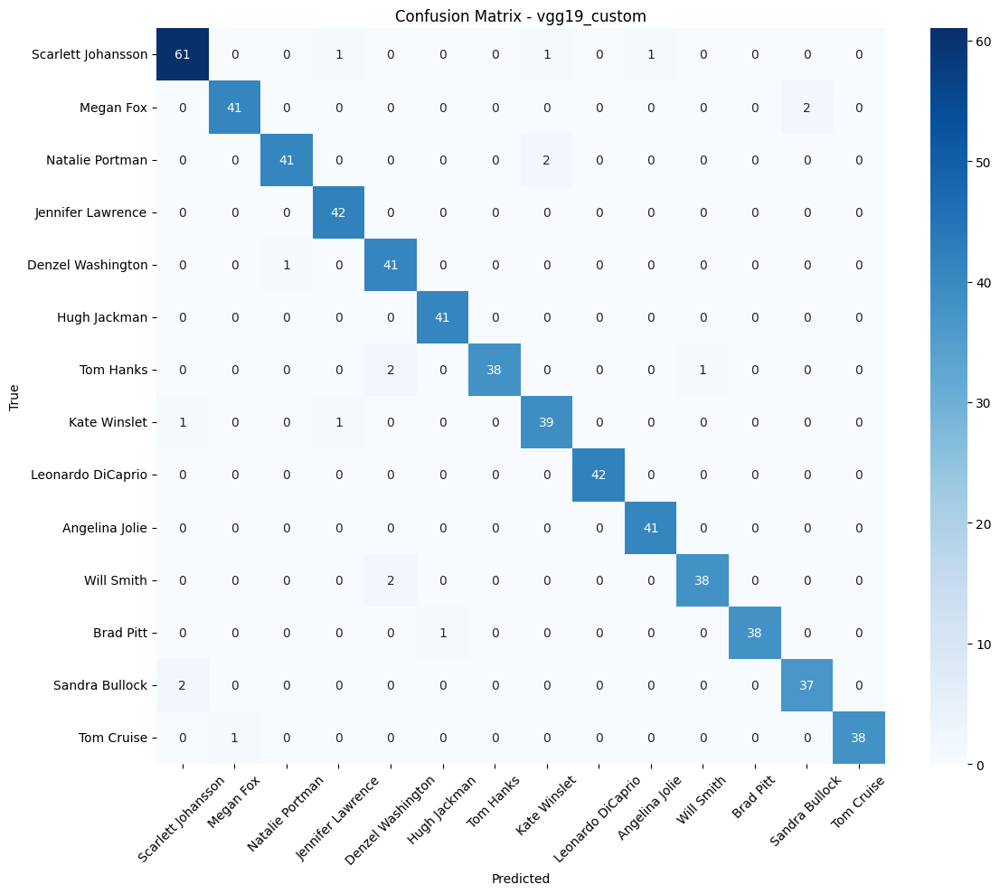

In [19]:
def evaluate_model(model, model_name, X_test, y_test, y_test_cat, class_names, is_pytorch=False):
    
    if is_pytorch:
        test_loader_pytorch = DataLoader(
            PyTorchFaceDataset(X_test, np.argmax(y_test_cat, axis=1), val_transform),
            batch_size=BATCH_SIZE, shuffle=False
        )
        y_pred, y_pred_proba, y_true = evaluate_pytorch_model(model, test_loader_pytorch)
    else:
        y_pred_proba = model.predict(X_test, verbose=0)
        y_pred = np.argmax(y_pred_proba, axis=1)
        y_true = np.argmax(y_test_cat, axis=1)
    
    accuracy = np.mean(y_pred == y_true)
    top3_accuracy = calculate_top_k_accuracy(y_true, y_pred_proba, k=3)
    top5_accuracy = calculate_top_k_accuracy(y_true, y_pred_proba, k=5)
    
    report = classification_report(y_true, y_pred, target_names=class_names, output_dict=True)
    
    roc_auc = plot_roc_curves(y_test_cat, y_pred_proba, class_names, model_name)
    
    plot_confusion_matrix(y_true, y_pred, class_names, model_name)
    
    return {
        'accuracy': accuracy,
        'top3_accuracy': top3_accuracy,
        'top5_accuracy': top5_accuracy,
        'classification_report': report,
        'roc_auc': roc_auc,
        'y_true': y_true,
        'y_pred': y_pred,
        'y_pred_proba': y_pred_proba
    }

print("Evaluating all models on test set...")

resnet_results = evaluate_model(best_resnet_model, 'resnet', X_test, y_test, y_test_cat, selected_class_names)

mobilenet_results = evaluate_model(best_mobilenet_model, 'mobilenet', X_test, y_test, y_test_cat, selected_class_names)

vit_results = evaluate_model(best_vit_model, 'vit', X_test, y_test, y_test_cat, selected_class_names)

inception_results = evaluate_model(best_inception_model, 'inceptionv1', X_test, y_test, y_test_cat, selected_class_names, is_pytorch=True)

vgg19_results = evaluate_model(best_vgg_model, 'vgg19_custom', X_test, y_test, y_test_cat, selected_class_names)

all_results = {
    'ResNet': resnet_results,
    'MobileNet': mobilenet_results,
    'ViT': vit_results,
    'Inception_v1': inception_results,
    'VGG19_Custom': vgg19_results
}

training_times = {
    'ResNet': best_resnet_time,
    'MobileNet': best_mobilenet_time,
    'ViT': best_vit_time,
    'Inception_v1': best_inception_time,
    'VGG19_Custom': best_vgg_time
}


COMPREHENSIVE TEST SET ACCURACY ANALYSIS

MODEL PERFORMANCE COMPARISON ON TEST SET
Model                Acc      Top-3    Top-5    F1       AUC      Time(s)    Wt.Acc   Hardest         Easiest        
Inception_v1         0.9883   1.0000   1.0000   0.9883   1.0000   683        0.9883   Sandra Bullock  Scarlett Johansson
VGG19_Custom         0.9682   0.9899   0.9950   0.9689   0.9995   1741       0.9682   Tom Hanks       Jennifer Lawrence
ResNet               0.9631   0.9899   1.0000   0.9633   0.9993   2435       0.9631   Natalie Portman Denzel Washington
MobileNet            0.9430   0.9916   0.9983   0.9437   0.9988   2033       0.9430   Natalie Portman Jennifer Lawrence
ViT                  0.7521   0.9531   0.9899   0.7553   0.9819   3982       0.7521   Kate Winslet    Megan Fox      

PER-CLASS ACCURACY COMPARISON (Top 3 Models)
Class               Inception_v1   VGG19_Custom   ResNet         
Scarlett Johansson  1.0000         0.9531         0.9688         
Megan Fox           0

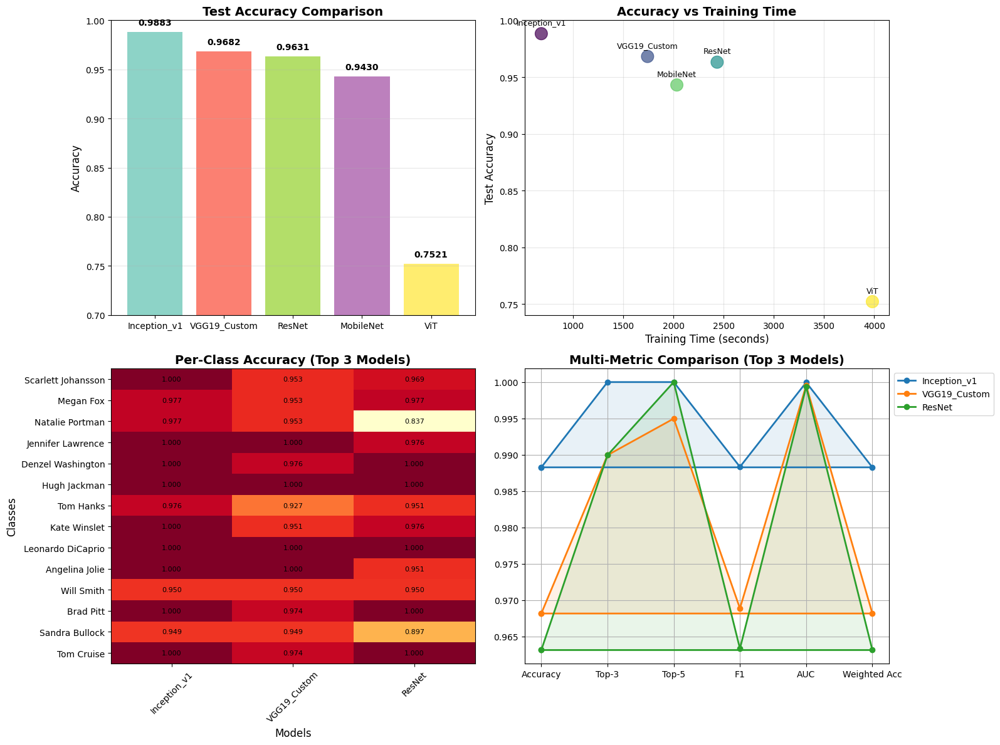


✅ Comprehensive test accuracy analysis saved to '/kaggle/working/plots/test_accuracy_comprehensive.png'
📊 Detailed results saved to '/kaggle/working/reports/test_accuracy_summary.json'

TEST ACCURACY ANALYSIS COMPLETED!


In [20]:

print("\n" + "=" * 80)
print("COMPREHENSIVE TEST SET ACCURACY ANALYSIS")
print("=" * 80)

test_accuracy_results = {}

for model_name, results in all_results.items():
    accuracy = results['accuracy']
    top3_accuracy = results['top3_accuracy']
    top5_accuracy = results['top5_accuracy']
    
    report = results['classification_report']
    precision = report['macro avg']['precision']
    recall = report['macro avg']['recall']
    f1 = report['macro avg']['f1-score']
    
    auc = results['roc_auc']['micro']
    
    training_time = training_times[model_name] if model_name in training_times else 0
    
    y_true = results['y_true']
    y_pred = results['y_pred']
    
    cm = confusion_matrix(y_true, y_pred)
    per_class_accuracy = cm.diagonal() / cm.sum(axis=1)
    
    class_counts = cm.sum(axis=1)
    weighted_accuracy = np.sum(per_class_accuracy * class_counts) / np.sum(class_counts)
    
    hardest_class_idx = np.argmin(per_class_accuracy)
    easiest_class_idx = np.argmax(per_class_accuracy)
    
    test_accuracy_results[model_name] = {
        'accuracy': float(accuracy),
        'top3_accuracy': float(top3_accuracy),
        'top5_accuracy': float(top5_accuracy),
        'precision': float(precision),
        'recall': float(recall),
        'f1_score': float(f1),
        'auc': float(auc),
        'weighted_accuracy': float(weighted_accuracy),
        'per_class_accuracy': per_class_accuracy.tolist(),
        'hardest_class_idx': int(hardest_class_idx),
        'easiest_class_idx': int(easiest_class_idx),
        'training_time': float(training_time),
        'confusion_matrix': cm.tolist()
    }

print("\n" + "=" * 100)
print("MODEL PERFORMANCE COMPARISON ON TEST SET")
print("=" * 100)
print(f"{'Model':<20} {'Acc':<8} {'Top-3':<8} {'Top-5':<8} {'F1':<8} {'AUC':<8} {'Time(s)':<10} {'Wt.Acc':<8} {'Hardest':<15} {'Easiest':<15}")
print("=" * 100)

sorted_models = sorted(test_accuracy_results.items(), 
                       key=lambda x: x[1]['accuracy'], 
                       reverse=True)

for model_name, metrics in sorted_models:
    hardest_class = selected_class_names[metrics['hardest_class_idx']]
    easiest_class = selected_class_names[metrics['easiest_class_idx']]
    
    print(f"{model_name:<20} "
          f"{metrics['accuracy']:<8.4f} "
          f"{metrics['top3_accuracy']:<8.4f} "
          f"{metrics['top5_accuracy']:<8.4f} "
          f"{metrics['f1_score']:<8.4f} "
          f"{metrics['auc']:<8.4f} "
          f"{metrics['training_time']:<10.0f} "
          f"{metrics['weighted_accuracy']:<8.4f} "
          f"{hardest_class:<15} "
          f"{easiest_class:<15}")

print("=" * 100)

print("\n" + "=" * 100)
print("PER-CLASS ACCURACY COMPARISON (Top 3 Models)")
print("=" * 100)
print(f"{'Class':<20}", end="")
for i, (model_name, _) in enumerate(sorted_models[:3]):
    print(f"{model_name:<15}", end="")
print()

for idx, class_name in enumerate(selected_class_names):
    print(f"{class_name:<20}", end="")
    for model_name, _ in sorted_models[:3]:
        acc = test_accuracy_results[model_name]['per_class_accuracy'][idx]
        print(f"{acc:<15.4f}", end="")
    print()

print("=" * 100)

print("\n" + "=" * 100)
print("STATISTICAL ANALYSIS")
print("=" * 100)

baseline_model = sorted_models[-1][0]
baseline_accuracy = sorted_models[-1][1]['accuracy']

print(f"Baseline Model: {baseline_model} ({baseline_accuracy:.4f})")
print()

for i, (model_name, metrics) in enumerate(sorted_models[:-1]):
    improvement = ((metrics['accuracy'] - baseline_accuracy) / baseline_accuracy) * 100
    time_ratio = metrics['training_time'] / sorted_models[-1][1]['training_time']
    
    print(f"{model_name}:")
    print(f"  • Absolute improvement: {metrics['accuracy'] - baseline_accuracy:+.4f}")
    print(f"  • Relative improvement: {improvement:+.1f}%")
    print(f"  • Time ratio vs baseline: {time_ratio:.2f}x")
    print(f"  • Accuracy per second: {metrics['accuracy'] / metrics['training_time']:.6f}")
    print()

best_model_name = sorted_models[0][0]
best_model_metrics = sorted_models[0][1]

print(f"\n🏆 BEST MODEL: {best_model_name}")
print("-" * 80)
print(f"Accuracy: {best_model_metrics['accuracy']:.4f}")
print(f"Top-3 Accuracy: {best_model_metrics['top3_accuracy']:.4f}")
print(f"Top-5 Accuracy: {best_model_metrics['top5_accuracy']:.4f}")
print(f"F1-Score: {best_model_metrics['f1_score']:.4f}")
print(f"AUC: {best_model_metrics['auc']:.4f}")
print(f"Training Time: {best_model_metrics['training_time']:.0f} seconds")
print(f"Weighted Accuracy: {best_model_metrics['weighted_accuracy']:.4f}")
print(f"\nHardest Class: {selected_class_names[best_model_metrics['hardest_class_idx']]} "
      f"({best_model_metrics['per_class_accuracy'][best_model_metrics['hardest_class_idx']]:.4f})")
print(f"Easiest Class: {selected_class_names[best_model_metrics['easiest_class_idx']]} "
      f"({best_model_metrics['per_class_accuracy'][best_model_metrics['easiest_class_idx']]:.4f})")

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

ax1 = axes[0, 0]
models = [m[0] for m in sorted_models]
accuracies = [m[1]['accuracy'] for m in sorted_models]
colors = plt.cm.Set3(np.linspace(0, 1, len(models)))

bars = ax1.bar(models, accuracies, color=colors)
ax1.set_title('Test Accuracy Comparison', fontsize=14, fontweight='bold')
ax1.set_ylabel('Accuracy', fontsize=12)
ax1.set_ylim(0.7, 1.0)
ax1.grid(axis='y', alpha=0.3)

for bar, acc in zip(bars, accuracies):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height + 0.005,
            f'{acc:.4f}', ha='center', va='bottom', fontweight='bold')

ax2 = axes[0, 1]
times = [m[1]['training_time'] for m in sorted_models]
scatter = ax2.scatter(times, accuracies, s=200, c=range(len(models)), cmap='viridis', alpha=0.7)

for i, (model, acc, time) in enumerate(zip(models, accuracies, times)):
    ax2.annotate(model, (time, acc), textcoords="offset points", 
                xytext=(0,10), ha='center', fontsize=9)

ax2.set_xlabel('Training Time (seconds)', fontsize=12)
ax2.set_ylabel('Test Accuracy', fontsize=12)
ax2.set_title('Accuracy vs Training Time', fontsize=14, fontweight='bold')
ax2.grid(alpha=0.3)

ax3 = axes[1, 0]
top_3_models = [m[0] for m in sorted_models[:3]]
per_class_data = []

for model_name in top_3_models:
    per_class_data.append(test_accuracy_results[model_name]['per_class_accuracy'])

heatmap_data = np.array(per_class_data).T
im = ax3.imshow(heatmap_data, cmap='YlOrRd', aspect='auto')
ax3.set_title('Per-Class Accuracy (Top 3 Models)', fontsize=14, fontweight='bold')
ax3.set_ylabel('Classes', fontsize=12)
ax3.set_xlabel('Models', fontsize=12)
ax3.set_xticks(range(len(top_3_models)))
ax3.set_xticklabels(top_3_models, rotation=45)
ax3.set_yticks(range(len(selected_class_names)))
ax3.set_yticklabels(selected_class_names)

for i in range(len(selected_class_names)):
    for j in range(len(top_3_models)):
        text = ax3.text(j, i, f'{heatmap_data[i, j]:.3f}',
                       ha="center", va="center", color="black", fontsize=8)

ax4 = axes[1, 1]
metrics_to_plot = ['accuracy', 'top3_accuracy', 'top5_accuracy', 'f1_score', 'auc', 'weighted_accuracy']
metric_labels = ['Accuracy', 'Top-3', 'Top-5', 'F1', 'AUC', 'Weighted Acc']

radar_data = []
for model_name in top_3_models:
    model_metrics = []
    for metric in metrics_to_plot:
        model_metrics.append(test_accuracy_results[model_name][metric])
    radar_data.append(model_metrics)

radar_data = np.array(radar_data)

num_vars = len(metric_labels)
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  

for i, model_name in enumerate(top_3_models):
    values = radar_data[i].tolist()
    values += values[:1]
    ax4.plot(angles, values, 'o-', linewidth=2, label=model_name)
    ax4.fill(angles, values, alpha=0.1)

ax4.set_xticks(angles[:-1])
ax4.set_xticklabels(metric_labels, fontsize=10)
ax4.set_title('Multi-Metric Comparison (Top 3 Models)', fontsize=14, fontweight='bold')
ax4.legend(loc='upper right', bbox_to_anchor=(1.3, 1.0))
ax4.grid(True)

plt.tight_layout()
plt.savefig('/kaggle/working/plots/test_accuracy_comprehensive.png', dpi=300, bbox_inches='tight')
plt.show()

def convert_to_serializable(obj):
    if isinstance(obj, dict):
        return {k: convert_to_serializable(v) for k, v in obj.items()}
    elif isinstance(obj, list):
        return [convert_to_serializable(item) for item in obj]
    elif isinstance(obj, tuple):
        return [convert_to_serializable(item) for item in obj]
    elif isinstance(obj, np.ndarray):
        return obj.tolist()
    elif isinstance(obj, (np.integer, np.int32, np.int64)):
        return int(obj)
    elif isinstance(obj, (np.floating, np.float32, np.float64)):
        return float(obj)
    elif isinstance(obj, np.bool_):
        return bool(obj)
    else:
        return obj

results_summary = {
    'test_accuracy_results': test_accuracy_results,
    'best_model': best_model_name,
    'sorted_models': [m[0] for m in sorted_models],
    'class_names': selected_class_names
}

results_summary_serializable = convert_to_serializable(results_summary)

with open('/kaggle/working/reports/test_accuracy_summary.json', 'w') as f:
    json.dump(results_summary_serializable, f, indent=4)

print(f"\n✅ Comprehensive test accuracy analysis saved to '/kaggle/working/plots/test_accuracy_comprehensive.png'")
print(f"📊 Detailed results saved to '/kaggle/working/reports/test_accuracy_summary.json'")
print("\n" + "=" * 80)
print("TEST ACCURACY ANALYSIS COMPLETED!")
print("=" * 80)

# Cell 19: Results Analysis and Visualization

/tmp/ipykernel_47/1501376670.py:81: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax3.set_xticklabels(models, rotation=45)
/tmp/ipykernel_47/1501376670.py:94: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax4.set_xticklabels(models, rotation=45)


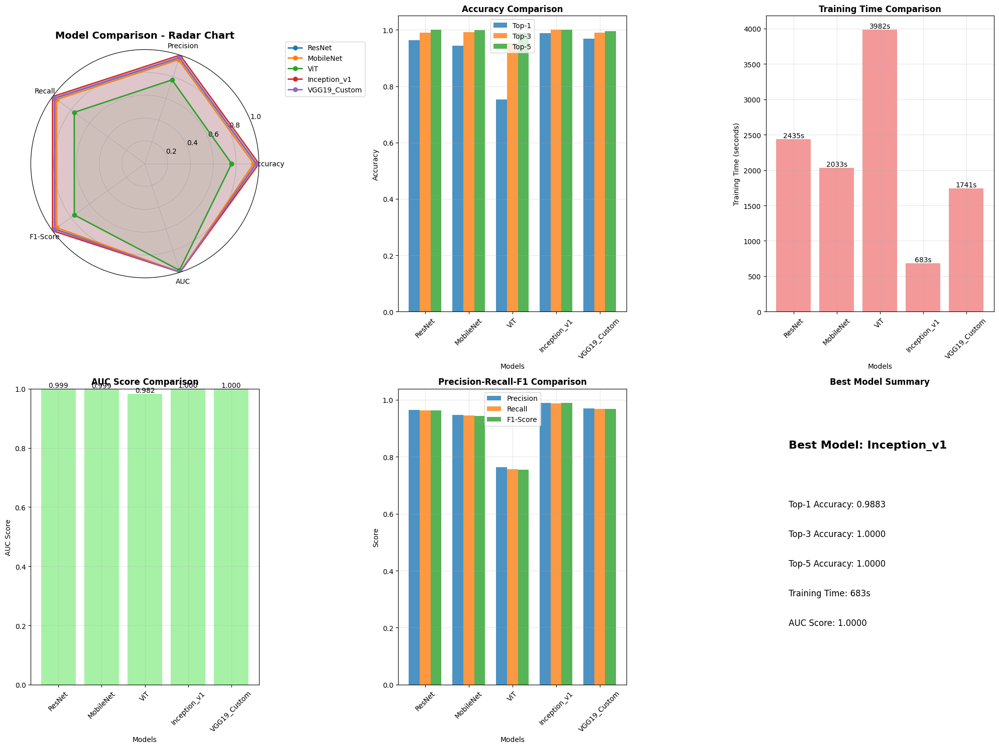

Comparison Dashboard Summary:
          Model  Accuracy  Top-3 Accuracy  Top-5 Accuracy  Precision  Recall  \
0        ResNet    0.9631          0.9899          1.0000     0.9650  0.9632   
1     MobileNet    0.9430          0.9916          0.9983     0.9471  0.9445   
2           ViT    0.7521          0.9531          0.9899     0.7637  0.7556   
3  Inception_v1    0.9883          1.0000          1.0000     0.9894  0.9877   
4  VGG19_Custom    0.9682          0.9899          0.9950     0.9697  0.9687   

   F1-Score     AUC  Training Time (s)  
0    0.9633  0.9993          2434.8736  
1    0.9437  0.9988          2033.2894  
2    0.7553  0.9819          3981.8244  
3    0.9883  1.0000           682.8918  
4    0.9689  0.9995          1741.4842  


In [21]:
def create_comparison_dashboard(all_results, training_times, class_names):
    
    models = list(all_results.keys())
    accuracies = [all_results[model]['accuracy'] for model in models]
    top3_accuracies = [all_results[model]['top3_accuracy'] for model in models]
    top5_accuracies = [all_results[model]['top5_accuracy'] for model in models]
    training_times_list = [training_times[model] for model in models]
    
    precisions = []
    recalls = []
    f1_scores = []
    auc_scores = []
    
    for model in models:
        report = all_results[model]['classification_report']
        precisions.append(report['macro avg']['precision'])
        recalls.append(report['macro avg']['recall'])
        f1_scores.append(report['macro avg']['f1-score'])
        
        auc_scores.append(all_results[model]['roc_auc']['micro'])
    
    comparison_df = pd.DataFrame({
        'Model': models,
        'Accuracy': accuracies,
        'Top-3 Accuracy': top3_accuracies,
        'Top-5 Accuracy': top5_accuracies,
        'Precision': precisions,
        'Recall': recalls,
        'F1-Score': f1_scores,
        'AUC': auc_scores,
        'Training Time (s)': training_times_list
    })
    
    comparison_df.to_csv('/kaggle/working/reports/summary_table.csv', index=False)
    
    fig = plt.figure(figsize=(20, 15))
    
    ax1 = plt.subplot(2, 3, 1, polar=True)
    
    metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'AUC']
    values = np.array([accuracies, precisions, recalls, f1_scores, auc_scores])
    
    values_normalized = values / values.max(axis=1, keepdims=True)
    
    angles = np.linspace(0, 2*np.pi, len(metrics), endpoint=False).tolist()
    angles += angles[:1]  
    
    for i, model in enumerate(models):
        model_values = values_normalized[:, i].tolist()
        model_values += model_values[:1]  
        ax1.plot(angles, model_values, 'o-', linewidth=2, label=model)
        ax1.fill(angles, model_values, alpha=0.1)
    
    ax1.set_xticks(angles[:-1])
    ax1.set_xticklabels(metrics)
    ax1.set_ylim(0, 1)
    ax1.set_title('Model Comparison - Radar Chart', size=14, fontweight='bold')
    ax1.legend(bbox_to_anchor=(1.1, 1.05))
    
    ax2 = plt.subplot(2, 3, 2)
    x_pos = np.arange(len(models))
    width = 0.25
    
    ax2.bar(x_pos - width, accuracies, width, label='Top-1', alpha=0.8)
    ax2.bar(x_pos, top3_accuracies, width, label='Top-3', alpha=0.8)
    ax2.bar(x_pos + width, top5_accuracies, width, label='Top-5', alpha=0.8)
    
    ax2.set_xlabel('Models')
    ax2.set_ylabel('Accuracy')
    ax2.set_title('Accuracy Comparison', fontweight='bold')
    ax2.set_xticks(x_pos)
    ax2.set_xticklabels(models, rotation=45)
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    ax3 = plt.subplot(2, 3, 3)
    bars = ax3.bar(models, training_times_list, color='lightcoral', alpha=0.8)
    ax3.set_xlabel('Models')
    ax3.set_ylabel('Training Time (seconds)')
    ax3.set_title('Training Time Comparison', fontweight='bold')
    ax3.set_xticklabels(models, rotation=45)
    ax3.grid(True, alpha=0.3)
    
    for bar in bars:
        height = bar.get_height()
        ax3.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.0f}s', ha='center', va='bottom')
    
    ax4 = plt.subplot(2, 3, 4)
    bars = ax4.bar(models, auc_scores, color='lightgreen', alpha=0.8)
    ax4.set_xlabel('Models')
    ax4.set_ylabel('AUC Score')
    ax4.set_title('AUC Score Comparison', fontweight='bold')
    ax4.set_xticklabels(models, rotation=45)
    ax4.set_ylim(0, 1)
    ax4.grid(True, alpha=0.3)
    
    for bar in bars:
        height = bar.get_height()
        ax4.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.3f}', ha='center', va='bottom')
    
    ax5 = plt.subplot(2, 3, 5)
    x_pos = np.arange(len(models))
    width = 0.25
    
    ax5.bar(x_pos - width, precisions, width, label='Precision', alpha=0.8)
    ax5.bar(x_pos, recalls, width, label='Recall', alpha=0.8)
    ax5.bar(x_pos + width, f1_scores, width, label='F1-Score', alpha=0.8)
    
    ax5.set_xlabel('Models')
    ax5.set_ylabel('Score')
    ax5.set_title('Precision-Recall-F1 Comparison', fontweight='bold')
    ax5.set_xticks(x_pos)
    ax5.set_xticklabels(models, rotation=45)
    ax5.legend()
    ax5.grid(True, alpha=0.3)
    
    best_model_idx = np.argmax(accuracies)
    best_model = models[best_model_idx]
    best_accuracy = accuracies[best_model_idx]
    
    ax6 = plt.subplot(2, 3, 6)
    ax6.text(0.1, 0.8, f'Best Model: {best_model}', fontsize=16, fontweight='bold')
    ax6.text(0.1, 0.6, f'Top-1 Accuracy: {best_accuracy:.4f}', fontsize=12)
    ax6.text(0.1, 0.5, f'Top-3 Accuracy: {top3_accuracies[best_model_idx]:.4f}', fontsize=12)
    ax6.text(0.1, 0.4, f'Top-5 Accuracy: {top5_accuracies[best_model_idx]:.4f}', fontsize=12)
    ax6.text(0.1, 0.3, f'Training Time: {training_times_list[best_model_idx]:.0f}s', fontsize=12)
    ax6.text(0.1, 0.2, f'AUC Score: {auc_scores[best_model_idx]:.4f}', fontsize=12)
    ax6.set_xlim(0, 1)
    ax6.set_ylim(0, 1)
    ax6.axis('off')
    ax6.set_title('Best Model Summary', fontweight='bold')
    
    plt.tight_layout()
    plt.savefig('/kaggle/working/plots/final_dashboard.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    return comparison_df

comparison_df = create_comparison_dashboard(all_results, training_times, selected_class_names)

print("Comparison Dashboard Summary:")
print(comparison_df.round(4))

# Cell 20: Error Analysis and Detailed Results

Error Analysis for Best Model: Inception_v1

Top 10 Most Confused Class Pairs:
True Class → Predicted Class (Count)
Will Smith → Denzel Washington (2)
Sandra Bullock → Scarlett Johansson (2)
Megan Fox → Kate Winslet (1)
Natalie Portman → Angelina Jolie (1)
Tom Hanks → Tom Cruise (1)

Visualizing 7 misclassified examples:


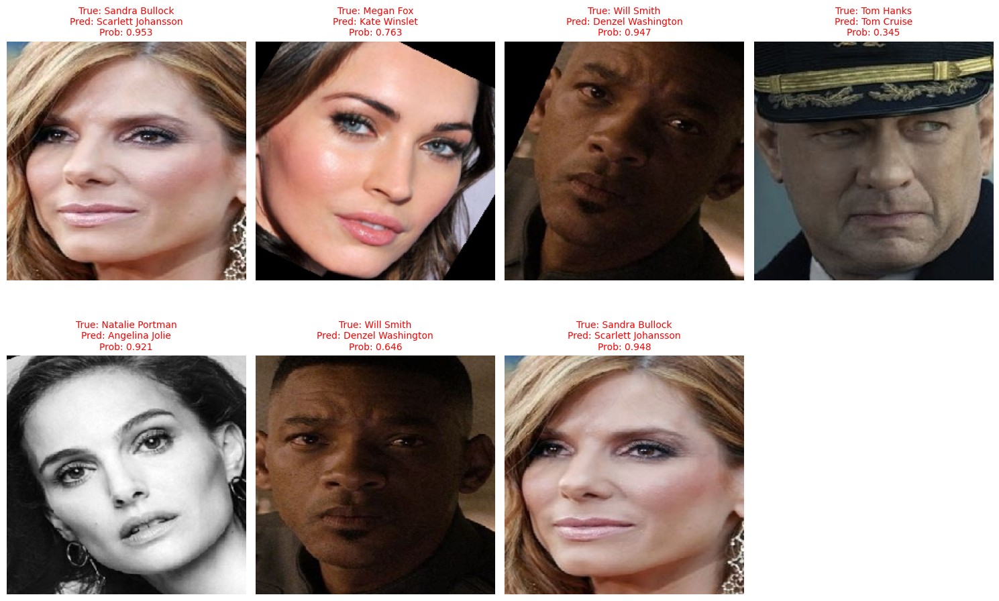

✓ Saved classification report for ResNet
✓ Saved classification report for MobileNet
✓ Saved classification report for ViT
✓ Saved classification report for Inception_v1
✓ Saved classification report for VGG19_Custom


In [22]:
def perform_error_analysis(all_results, class_names, X_test):
    
    best_model_name = max(all_results.keys(), 
                         key=lambda x: all_results[x]['accuracy'])
    best_results = all_results[best_model_name]
    
    print(f"Error Analysis for Best Model: {best_model_name}")
    print("=" * 60)
    
    y_true = best_results['y_true']
    y_pred = best_results['y_pred']
    
    cm = confusion_matrix(y_true, y_pred)
    
    misclassifications = []
    for i in range(len(class_names)):
        for j in range(len(class_names)):
            if i != j and cm[i, j] > 0:
                misclassifications.append((i, j, cm[i, j]))
    
    misclassifications.sort(key=lambda x: x[2], reverse=True)
    
    print("\nTop 10 Most Confused Class Pairs:")
    print("True Class → Predicted Class (Count)")
    for i, j, count in misclassifications[:10]:
        print(f"{class_names[i]} → {class_names[j]} ({count})")
    
    misclassified_indices = np.where(y_pred != y_true)[0]
    
    if len(misclassified_indices) > 0:
        print(f"\nVisualizing {min(8, len(misclassified_indices))} misclassified examples:")
        
        plt.figure(figsize=(15, 10))
        n_samples = min(8, len(misclassified_indices))
        
        for idx, mis_idx in enumerate(misclassified_indices[:n_samples]):
            plt.subplot(2, 4, idx + 1)
            
            plt.imshow(X_test[mis_idx].astype('uint8'))
            
            true_class = class_names[y_true[mis_idx]]
            pred_class = class_names[y_pred[mis_idx]]
            prob = np.max(best_results['y_pred_proba'][mis_idx])
            
            plt.title(f'True: {true_class}\nPred: {pred_class}\nProb: {prob:.3f}', 
                     fontsize=10, color='red')
            plt.axis('off')
        
        plt.tight_layout()
        plt.savefig('/kaggle/working/plots/misclassified_examples.png', 
                   dpi=300, bbox_inches='tight')
        plt.show()
    
    for model_name, results in all_results.items():
        report_df = pd.DataFrame(results['classification_report']).transpose()
        report_df.to_csv(f'/kaggle/working/reports/classification_report_{model_name}.csv')
        print(f"✓ Saved classification report for {model_name}")
    
    return best_model_name

best_model = perform_error_analysis(all_results, selected_class_names, X_test)

# Cell 21: Identify and Visualize Best Model Predictions

In [23]:
def identify_best_model_predictions(all_results, class_names, X_test, num_examples=5):
    
    best_model_name = max(all_results.keys(), 
                         key=lambda x: all_results[x]['accuracy'])
    best_results = all_results[best_model_name]
    
    y_true = best_results['y_true']
    y_pred = best_results['y_pred']
    y_pred_proba = best_results['y_pred_proba']
    
    correct_indices = np.where(y_pred == y_true)[0]
    incorrect_indices = np.where(y_pred != y_true)[0]
    
    if len(incorrect_indices) > 0:
        incorrect_confidences = np.max(y_pred_proba[incorrect_indices], axis=1)
        incorrect_sorted_idx = incorrect_indices[np.argsort(-incorrect_confidences)]
    else:
        incorrect_sorted_idx = incorrect_indices
    
    if len(correct_indices) > 0:
        correct_confidences = np.max(y_pred_proba[correct_indices], axis=1)
        correct_sorted_idx = correct_indices[np.argsort(correct_confidences)]  
    else:
        correct_sorted_idx = correct_indices
    
    return {
        'model_name': best_model_name,
        'correct_indices': correct_sorted_idx[:num_examples*2],  
        'incorrect_indices': incorrect_sorted_idx[:num_examples*2],
        'y_true': y_true,
        'y_pred': y_pred,
        'y_pred_proba': y_pred_proba
    }

best_predictions = identify_best_model_predictions(all_results, selected_class_names, X_test, num_examples=5)
print(f"Best Model Identified: {best_predictions['model_name']}")
print(f"Number of correct predictions available: {len(best_predictions['correct_indices'])}")
print(f"Number of incorrect predictions available: {len(best_predictions['incorrect_indices'])}")

Best Model Identified: Inception_v1
Number of correct predictions available: 10
Number of incorrect predictions available: 7


# Cell 22: Visualize Correct Predictions from Best Model

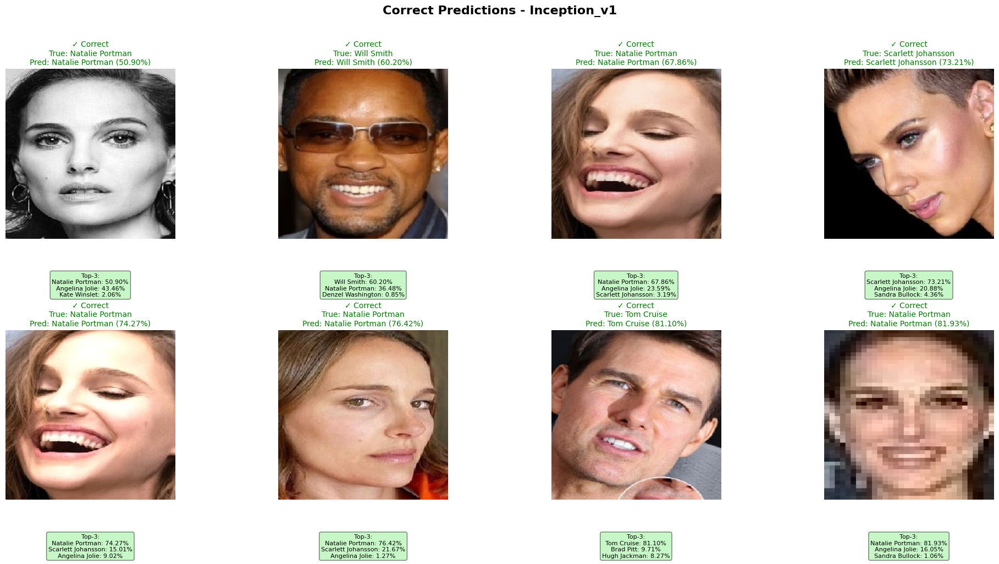

✓ Saved correct predictions visualization


In [24]:
def visualize_correct_predictions(best_predictions, X_test, class_names, num_examples=8):
    
    if len(best_predictions['correct_indices']) == 0:
        print("No correct predictions to visualize.")
        return
    
    n_examples = min(num_examples, len(best_predictions['correct_indices']))
    indices = best_predictions['correct_indices'][:n_examples]
    
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    axes = axes.ravel()
    
    for idx, ax_idx in enumerate(indices):
        ax = axes[idx]
        
        ax.imshow(X_test[ax_idx].astype('uint8'))
        
        true_class = class_names[best_predictions['y_true'][ax_idx]]
        pred_class = class_names[best_predictions['y_pred'][ax_idx]]
        prob = np.max(best_predictions['y_pred_proba'][ax_idx])
        
        top3_idx = np.argsort(best_predictions['y_pred_proba'][ax_idx])[-3:][::-1]
        top3_classes = [class_names[i] for i in top3_idx]
        top3_probs = best_predictions['y_pred_proba'][ax_idx][top3_idx]
        
        title = f'✓ Correct\nTrue: {true_class}\nPred: {pred_class} ({prob:.2%})'
        ax.set_title(title, fontsize=10, color='green')
        
        top3_text = "Top-3:\n"
        for cls, prob_val in zip(top3_classes, top3_probs):
            top3_text += f"{cls}: {prob_val:.2%}\n"
        
        ax.text(0.5, -0.2, top3_text[:-1], transform=ax.transAxes,
                fontsize=8, ha='center', va='top',
                bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.5))
        
        ax.axis('off')
    
    for i in range(len(indices), len(axes)):
        axes[i].axis('off')
    
    plt.suptitle(f'Correct Predictions - {best_predictions["model_name"]}', 
                fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig('/kaggle/working/plots/correct_predictions.png', 
                dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"✓ Saved correct predictions visualization")

visualize_correct_predictions(best_predictions, X_test, selected_class_names, num_examples=8)

# Cell 23: Visualize Incorrect Predictions from Best Model

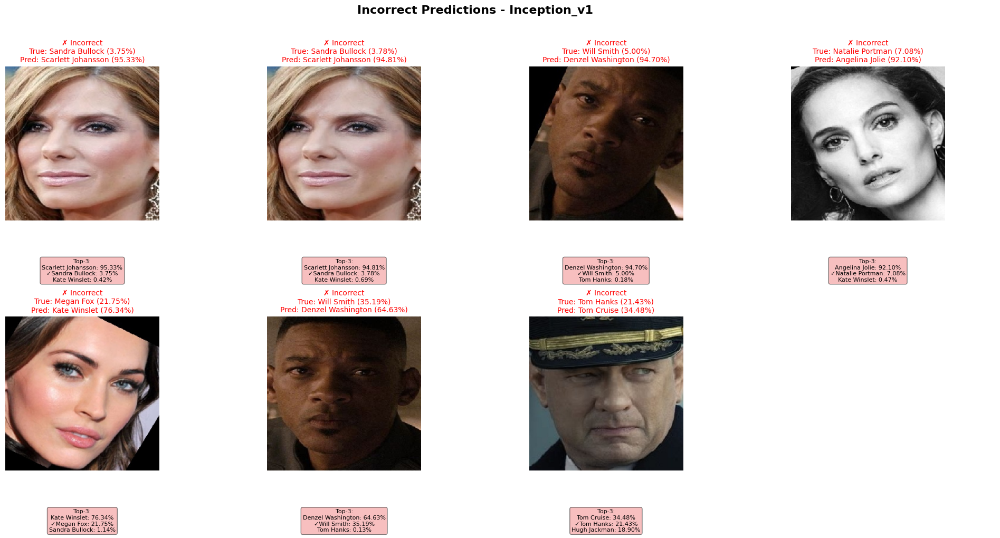


Analysis of Incorrect Predictions:
Total incorrect: 7
Accuracy of best model: 98.83%
Average confidence for incorrect predictions: 78.91%
Highest confidence incorrect prediction: 95.33%


In [25]:
def visualize_incorrect_predictions(best_predictions, X_test, class_names, num_examples=8):
    
    if len(best_predictions['incorrect_indices']) == 0:
        print("No incorrect predictions to visualize.")
        return
    
    n_examples = min(num_examples, len(best_predictions['incorrect_indices']))
    indices = best_predictions['incorrect_indices'][:n_examples]
    
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    axes = axes.ravel()
    
    for idx, ax_idx in enumerate(indices):
        ax = axes[idx]
        
        ax.imshow(X_test[ax_idx].astype('uint8'))
        
        true_class = class_names[best_predictions['y_true'][ax_idx]]
        pred_class = class_names[best_predictions['y_pred'][ax_idx]]
        pred_prob = np.max(best_predictions['y_pred_proba'][ax_idx])
        true_prob = best_predictions['y_pred_proba'][ax_idx][best_predictions['y_true'][ax_idx]]
        
        top3_idx = np.argsort(best_predictions['y_pred_proba'][ax_idx])[-3:][::-1]
        top3_classes = [class_names[i] for i in top3_idx]
        top3_probs = best_predictions['y_pred_proba'][ax_idx][top3_idx]
        
        title = f'✗ Incorrect\nTrue: {true_class} ({true_prob:.2%})\nPred: {pred_class} ({pred_prob:.2%})'
        ax.set_title(title, fontsize=10, color='red')
        
        top3_text = "Top-3:\n"
        for cls, prob_val in zip(top3_classes, top3_probs):
            marker = "✓" if cls == true_class else ""
            color = 'green' if cls == true_class else 'black'
            top3_text += f"{marker}{cls}: {prob_val:.2%}\n"
        
        ax.text(0.5, -0.25, top3_text[:-1], transform=ax.transAxes,
                fontsize=8, ha='center', va='top',
                bbox=dict(boxstyle='round', facecolor='lightcoral', alpha=0.5))
        
        ax.axis('off')
    
    for i in range(len(indices), len(axes)):
        axes[i].axis('off')
    
    plt.suptitle(f'Incorrect Predictions - {best_predictions["model_name"]}', 
                fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig('/kaggle/working/plots/incorrect_predictions.png', 
                dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"\nAnalysis of Incorrect Predictions:")
    print(f"Total incorrect: {len(best_predictions['incorrect_indices'])}")
    print(f"Accuracy of best model: {all_results[best_predictions['model_name']]['accuracy']:.2%}")
    
    if len(best_predictions['incorrect_indices']) > 0:
        incorrect_confidences = np.max(best_predictions['y_pred_proba'][best_predictions['incorrect_indices']], axis=1)
        print(f"Average confidence for incorrect predictions: {np.mean(incorrect_confidences):.2%}")
        print(f"Highest confidence incorrect prediction: {np.max(incorrect_confidences):.2%}")

visualize_incorrect_predictions(best_predictions, X_test, selected_class_names, num_examples=8)

# Cell 24: Radar Chart for Model Comparison

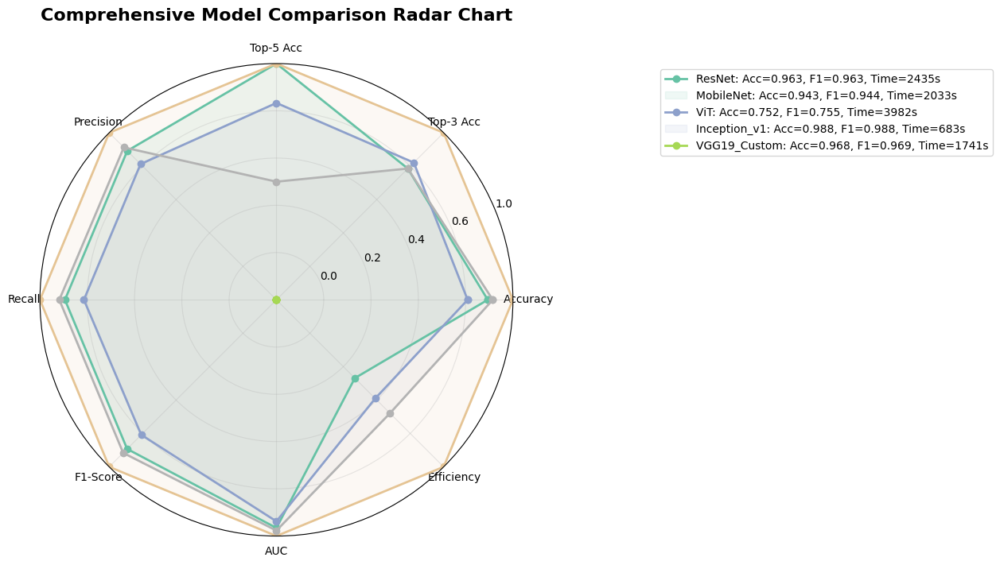


Model Performance Summary:
--------------------------------------------------------------------------------
Model                Accuracy   F1-Score   AUC        Time(s)   
--------------------------------------------------------------------------------
ResNet               0.9631     0.9633     0.9993     2435      
MobileNet            0.9430     0.9437     0.9988     2033      
ViT                  0.7521     0.7553     0.9819     3982      
Inception_v1         0.9883     0.9883     1.0000     683       
VGG19_Custom         0.9682     0.9689     0.9995     1741      

Best Models by Category:
  • Accuracy: Inception_v1 (0.9883)
  • F1-Score: Inception_v1 (0.9883)
  • AUC: Inception_v1 (1.0000)
  • Efficiency (Fastest): Inception_v1 (683s)


In [26]:
def create_radar_chart_comparison(all_results, training_times):
    
    models = list(all_results.keys())
    
    metrics = ['Accuracy', 'Top-3 Acc', 'Top-5 Acc', 'Precision', 'Recall', 'F1-Score', 'AUC', 'Efficiency']
    
    accuracies = [all_results[model]['accuracy'] for model in models]
    top3_accuracies = [all_results[model]['top3_accuracy'] for model in models]
    top5_accuracies = [all_results[model]['top5_accuracy'] for model in models]
    
    precisions = []
    recalls = []
    f1_scores = []
    auc_scores = []
    
    for model in models:
        report = all_results[model]['classification_report']
        precisions.append(report['macro avg']['precision'])
        recalls.append(report['macro avg']['recall'])
        f1_scores.append(report['macro avg']['f1-score'])
        auc_scores.append(all_results[model]['roc_auc']['micro'])
    
    max_time = max(training_times.values())
    normalized_times = [1 - (training_times[model] / max_time) for model in models]
    
    all_values = np.array([
        accuracies,
        top3_accuracies, 
        top5_accuracies,
        precisions,
        recalls,
        f1_scores,
        auc_scores,
        normalized_times 
    ])
    
    values_normalized = np.zeros_like(all_values)
    for i in range(len(all_values)):
        min_val = all_values[i].min()
        max_val = all_values[i].max()
        if max_val > min_val:
            values_normalized[i] = (all_values[i] - min_val) / (max_val - min_val)
        else:
            values_normalized[i] = 0.5  
    
    num_metrics = len(metrics)
    angles = np.linspace(0, 2 * np.pi, num_metrics, endpoint=False).tolist()
    angles += angles[:1] 
    
    fig, ax = plt.subplots(figsize=(12, 10), subplot_kw=dict(projection='polar'))
    
    colors = plt.cm.Set2(np.linspace(0, 1, len(models)))
    
    for i, model in enumerate(models):
        values = values_normalized[:, i].tolist()
        values += values[:1] 
        
        ax.plot(angles, values, 'o-', linewidth=2, label=model, color=colors[i])
        ax.fill(angles, values, alpha=0.1, color=colors[i])
    
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(metrics)
    
    ax.set_ylim(0, 1)
    ax.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
    ax.set_yticklabels(['0.0', '0.2', '0.4', '0.6', '1.0'])
    
    ax.set_title('Comprehensive Model Comparison Radar Chart', 
                fontsize=16, fontweight='bold', pad=20)
    
    legend_text = []
    for i, model in enumerate(models):
        acc = accuracies[i]
        f1 = f1_scores[i]
        time_val = training_times[model]
        legend_text.append(f"{model}: Acc={acc:.3f}, F1={f1:.3f}, Time={time_val:.0f}s")
    
    ax.legend(legend_text, bbox_to_anchor=(1.3, 1.0), fontsize=10)
    
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('/kaggle/working/plots/radar_chart_comparison.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    print("\nModel Performance Summary:")
    print("-" * 80)
    print(f"{'Model':<20} {'Accuracy':<10} {'F1-Score':<10} {'AUC':<10} {'Time(s)':<10}")
    print("-" * 80)
    
    for model in models:
        idx = models.index(model)
        acc = accuracies[idx]
        f1 = f1_scores[idx]
        auc = auc_scores[idx]
        time_val = training_times[model]
        print(f"{model:<20} {acc:<10.4f} {f1:<10.4f} {auc:<10.4f} {time_val:<10.0f}")
    
    print("\nBest Models by Category:")
    print(f"  • Accuracy: {models[np.argmax(accuracies)]} ({max(accuracies):.4f})")
    print(f"  • F1-Score: {models[np.argmax(f1_scores)]} ({max(f1_scores):.4f})")
    print(f"  • AUC: {models[np.argmax(auc_scores)]} ({max(auc_scores):.4f})")
    print(f"  • Efficiency (Fastest): {models[np.argmin([training_times[m] for m in models])]} ({min(training_times.values()):.0f}s)")
    
    return {
        'models': models,
        'accuracies': accuracies,
        'f1_scores': f1_scores,
        'auc_scores': auc_scores,
        'training_times': [training_times[m] for m in models]
    }

performance_summary = create_radar_chart_comparison(all_results, training_times)

# Cell 25: Additional Visualizations - Model Confidence Distribution

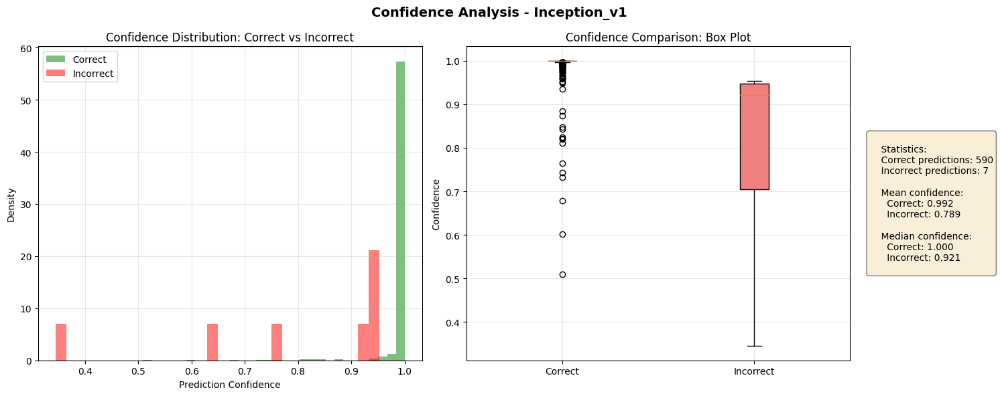

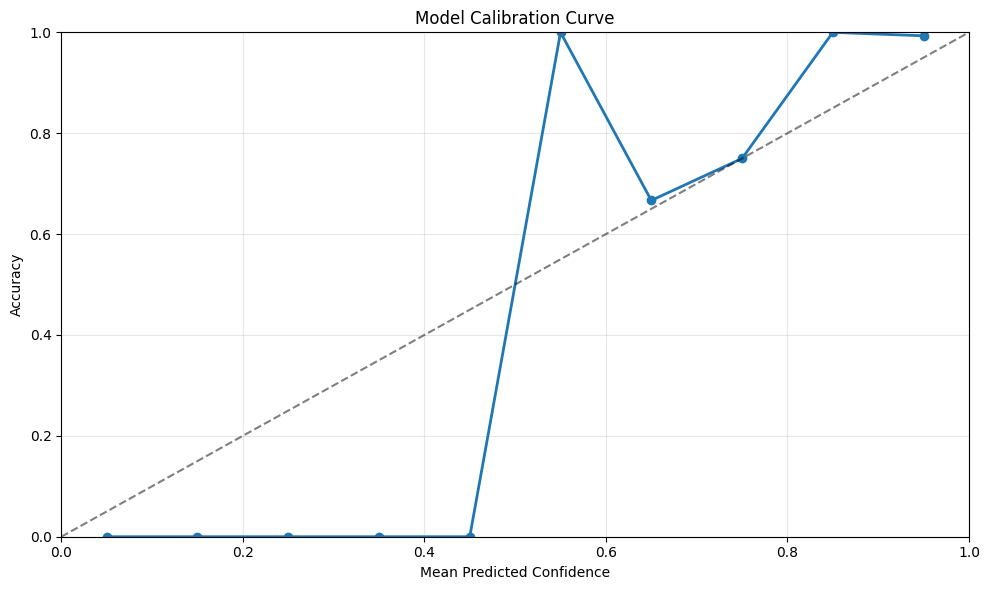

In [27]:
def plot_confidence_distributions(best_predictions, all_results):
    
    model_name = best_predictions['model_name']
    results = all_results[model_name]
    
    y_true = results['y_true']
    y_pred = results['y_pred']
    y_pred_proba = results['y_pred_proba']
    
    confidences = np.max(y_pred_proba, axis=1)
    
    correct_mask = (y_pred == y_true)
    incorrect_mask = (y_pred != y_true)
    
    correct_confidences = confidences[correct_mask]
    incorrect_confidences = confidences[incorrect_mask]
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    ax1.hist(correct_confidences, bins=30, alpha=0.5, label='Correct', color='green', density=True)
    ax1.hist(incorrect_confidences, bins=30, alpha=0.5, label='Incorrect', color='red', density=True)
    ax1.set_xlabel('Prediction Confidence')
    ax1.set_ylabel('Density')
    ax1.set_title('Confidence Distribution: Correct vs Incorrect')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    data_to_plot = [correct_confidences, incorrect_confidences]
    bp = ax2.boxplot(data_to_plot, patch_artist=True, labels=['Correct', 'Incorrect'])
    
    colors = ['lightgreen', 'lightcoral']
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)
    
    ax2.set_ylabel('Confidence')
    ax2.set_title('Confidence Comparison: Box Plot')
    ax2.grid(True, alpha=0.3)
    
    stats_text = f"""
    Statistics:
    Correct predictions: {len(correct_confidences)}
    Incorrect predictions: {len(incorrect_confidences)}
    
    Mean confidence:
      Correct: {np.mean(correct_confidences):.3f}
      Incorrect: {np.mean(incorrect_confidences):.3f}
    
    Median confidence:
      Correct: {np.median(correct_confidences):.3f}
      Incorrect: {np.median(incorrect_confidences):.3f}
    """
    
    ax2.text(1.05, 0.5, stats_text, transform=ax2.transAxes, fontsize=10,
             verticalalignment='center', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    plt.suptitle(f'Confidence Analysis - {model_name}', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig('/kaggle/working/plots/confidence_distribution.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    bins = np.linspace(0, 1, 11)
    bin_accuracies = []
    
    for i in range(len(bins) - 1):
        mask = (confidences >= bins[i]) & (confidences < bins[i+1])
        if np.sum(mask) > 0:
            bin_accuracy = np.mean(y_pred[mask] == y_true[mask])
            bin_accuracies.append(bin_accuracy)
        else:
            bin_accuracies.append(0)
    
    fig, ax = plt.subplots(figsize=(10, 6))
    bin_centers = (bins[:-1] + bins[1:]) / 2
    ax.plot(bin_centers, bin_accuracies, 'o-', linewidth=2)
    ax.plot([0, 1], [0, 1], 'k--', alpha=0.5)  
    ax.set_xlabel('Mean Predicted Confidence')
    ax.set_ylabel('Accuracy')
    ax.set_title('Model Calibration Curve')
    ax.grid(True, alpha=0.3)
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    
    plt.tight_layout()
    plt.savefig('/kaggle/working/plots/calibration_curve.png', dpi=300, bbox_inches='tight')
    plt.show()

plot_confidence_distributions(best_predictions, all_results)

# Cell 26: Final Summary and Conclusions

In [28]:
def generate_final_summary(all_results, training_times, best_model):
    
    print("=" * 80)
    print("FINAL PROJECT SUMMARY")
    print("=" * 80)
    
    print(f"\nDataset Statistics:")
    print(f"  - Selected Classes: {NUM_CLASSES}")
    print(f"  - Total Images: {len(X)}")
    print(f"  - Training Set: {X_train.shape[0]} images")
    print(f"  - Validation Set: {X_val.shape[0]} images") 
    print(f"  - Test Set: {X_test.shape[0]} images")
    print(f"  - Image Size: {IMG_SIZE}")
    print(f"  - Imbalance Ratio: {imbalance_ratio:.2f}")
    
    print(f"\nBest Performing Model: {best_model}")
    print(f"  - Top-1 Accuracy: {all_results[best_model]['accuracy']:.4f}")
    print(f"  - Top-3 Accuracy: {all_results[best_model]['top3_accuracy']:.4f}")
    print(f"  - Top-5 Accuracy: {all_results[best_model]['top5_accuracy']:.4f}")
    print(f"  - Training Time: {training_times[best_model]:.0f} seconds")
    
    print(f"\nModel Performance Ranking (by Top-1 Accuracy):")
    sorted_models = sorted(all_results.keys(), 
                          key=lambda x: all_results[x]['accuracy'], 
                          reverse=True)
    
    for i, model in enumerate(sorted_models, 1):
        acc = all_results[model]['accuracy']
        time_sec = training_times[model]
        print(f"  {i}. {model}: {acc:.4f} (Time: {time_sec:.0f}s)")
    
    print(f"\nTraining Configuration:")
    print(f"  - Batch Size: {BATCH_SIZE}")
    print(f"  - Maximum Epochs: 50")
    print(f"  - Early Stopping Patience: 6")
    print(f"  - Learning Rate: 1e-4 with ReduceLROnPlateau")
    print(f"  - Class Weights: Applied for imbalanced data")
    
    print(f"\nAugmentation Strategy:")
    print(f"  - Rotation: ±15°")
    print(f"  - Width/Height Shift: ±10%")
    print(f"  - Shear: 0.1")
    print(f"  - Zoom: 0.1") 
    print(f"  - Horizontal Flip: True")
    print(f"  - Brightness Range: [0.9, 1.1]")
    
    print(f"\nSaved Artifacts:")
    print(f"  - Models: /kaggle/working/models/")
    print(f"  - Plots: /kaggle/working/plots/")
    print(f"  - Reports: /kaggle/working/reports/")
    print(f"  - Final Dashboard: /kaggle/working/plots/final_dashboard.png")
    
    print(f"\nKey Findings:")
    
    # Define a dictionary to store the actual history objects
    # These need to be defined in your global scope or passed as parameters
    history_dict = {}
    
    # Try to get history from global variables if they exist
    try:
        if 'best_resnet_history' in globals():
            history_dict['ResNet'] = best_resnet_history
        if 'best_mobilenet_history' in globals():
            history_dict['MobileNet'] = best_mobilenet_history
        if 'best_vit_history' in globals():
            history_dict['ViT'] = best_vit_history
        if 'best_vgg19_history' in globals():
            history_dict['VGG19_Custom'] = best_vgg19_history
        if 'best_inception_history' in globals():
            history_dict['Inception_v1'] = best_inception_history
    except NameError:
        # If variables don't exist, skip this section
        pass
    
    # Check if we have any history data
    if history_dict:
        for model_name, history in history_dict.items():
            if model_name == best_model:
                continue  # Skip the best model
            
            # Check if history is a Keras History object or a dictionary
            if hasattr(history, 'history'):
                # It's a Keras History object
                history_data = history.history
            elif isinstance(history, dict) and 'accuracy' in history:
                # It's already a dictionary with history data
                history_data = history
            else:
                # Can't process this history
                continue
                
            if 'accuracy' in history_data and 'val_accuracy' in history_data:
                final_train_acc = history_data['accuracy'][-1] if history_data['accuracy'] else 0
                final_val_acc = history_data['val_accuracy'][-1] if history_data['val_accuracy'] else 0
                gap = final_train_acc - final_val_acc
                
                if gap > 0.15:
                    status = "Overfitting"
                elif final_train_acc < 0.6:
                    status = "Underfitting" 
                else:
                    status = "Well Generalized"
                    
                print(f"  - {model_name}: {status} (Gap: {gap:.3f})")
            else:
                print(f"  - {model_name}: History data not available")
    else:
        print(f"  - No training history available for analysis")
    
   

    return best_model, sorted_models

# Call the function
best_model, ranked_models = generate_final_summary(all_results, training_times, best_model)

print("\n" + "=" * 80)
print("PROJECT COMPLETED SUCCESSFULLY!")
print("All models trained, evaluated, and artifacts saved.")
print("=" * 80)

FINAL PROJECT SUMMARY

Dataset Statistics:
  - Selected Classes: 14
  - Total Images: 3980
  - Training Set: 2786 images
  - Validation Set: 597 images
  - Test Set: 597 images
  - Image Size: (224, 224)
  - Imbalance Ratio: 1.66

Best Performing Model: Inception_v1
  - Top-1 Accuracy: 0.9883
  - Top-3 Accuracy: 1.0000
  - Top-5 Accuracy: 1.0000
  - Training Time: 683 seconds

Model Performance Ranking (by Top-1 Accuracy):
  1. Inception_v1: 0.9883 (Time: 683s)
  2. VGG19_Custom: 0.9682 (Time: 1741s)
  3. ResNet: 0.9631 (Time: 2435s)
  4. MobileNet: 0.9430 (Time: 2033s)
  5. ViT: 0.7521 (Time: 3982s)

Training Configuration:
  - Batch Size: 32
  - Maximum Epochs: 50
  - Early Stopping Patience: 6
  - Learning Rate: 1e-4 with ReduceLROnPlateau
  - Class Weights: Applied for imbalanced data

Augmentation Strategy:
  - Rotation: ±15°
  - Width/Height Shift: ±10%
  - Shear: 0.1
  - Zoom: 0.1
  - Horizontal Flip: True
  - Brightness Range: [0.9, 1.1]

Saved Artifacts:
  - Models: /kaggle/wo